In [143]:
from matplotlib.colors import LogNorm
import matplotlib.pyplot as plt 
import numpy as np 
import pandas as pd
import os

def read_image(hdr_path):

    # 1️⃣ read from the hearder
    shape = []
    voxel_size = []
    byte_order = 'little'
    dtype = None
    img_path = hdr_path.replace(".hdr", ".img")


    with open(hdr_path, 'r') as f:
        for line in f:
            if "matrix size [1]" in line:
                shape.insert(0, int(line.split(":=")[-1]))
            elif "matrix size [2]" in line:
                shape.insert(0, int(line.split(":=")[-1]))
            elif "matrix size [3]" in line:
                shape.insert(0, int(line.split(":=")[-1]))
            elif "number format" in line:
                fmt = line.split(":=")[-1].strip().lower()
                if "short float" in fmt:
                    dtype = np.float32
                elif "long float" in fmt:
                    dtype = np.float64
                elif "signed integer" in fmt:
                    dtype = np.int32
                elif "unsigned integer" in fmt:
                    dtype = np.uint32
            elif "imagedata byte order" in line:
                if "little" in line.lower():
                    byte_order = "little"
                elif "big" in line.lower():
                    byte_order = "big"

    # 2️⃣ read the binary data
    byteorder_prefix = "<" if byte_order == "little" else ">"
    with open(img_path, "rb") as f:
        data = np.fromfile(f, dtype=byteorder_prefix + dtype().dtype.char)

    # 3️⃣ reshape to 3d array
    data = data.reshape(shape)
    return data


In [144]:
import os
import numpy as np

CRYSTAL_OPTIONS = ["original", "fine", "super_fine"]
SOURCE_DISTS = np.array(list(np.arange(0.0, 1.0, 0.1)) + list(np.arange(1.0,5.1,1.0)))
MATERIALS = ["LYSO", "LXe"]

raw_data_shape = (1, 400, 400)   # (z, y, x) or whatever your 3D shape is
data_shape = (len(MATERIALS), len(CRYSTAL_OPTIONS), len(SOURCE_DISTS)) + raw_data_shape

# Initialize big array with NaNs
all_data = np.full(data_shape, np.nan, dtype=np.float32)

for i_mat, material in enumerate(MATERIALS):
    for j_opt, crystal_option in enumerate(CRYSTAL_OPTIONS):
        for k_dist, source_dist in enumerate(SOURCE_DISTS):
            prefix = f"{material}_src{source_dist:.1f}cm_{crystal_option}"
            hdr_path = f"/Users/yuema/MyCode/castor_v3.2/LXePET_Radius_Compare/{prefix}_it4.hdr"

            if not os.path.exists(hdr_path):
                print(f"[Warning] Missing: {hdr_path}")
                continue

            img = read_image(hdr_path)
            img = np.asarray(img, dtype=np.float32)  # ensure correct dtype and array

            if img.shape != raw_data_shape:
                print(f"[Shape mismatch] {prefix}: got {img.shape}, expected {raw_data_shape}")
                continue

            # ✅ Use full slice per dimension — important for clarity and correctness
            all_data[i_mat, j_opt, k_dist, :, :, :] = img

print("✅ All data loaded successfully!")


✅ All data loaded successfully!


In [145]:
all_data.shape

(2, 3, 15, 1, 400, 400)

In [146]:
from scipy.ndimage import gaussian_filter1d

# ==============================================================
# FWHM computation
# ==============================================================

def direct_fwhm(profile, smooth_sigma=1.0, window=None):
    """
    Robust FWHM from a 1D profile:
      - Gaussian smooth
      - Baseline subtract
      - Find nearest half-max crossings around the main peak (left/right)
      - Sub-pixel linear interpolation
    Returns (fwhm_pix, smoothed)
    """
    smoothed = gaussian_filter1d(profile, sigma=smooth_sigma)
    smoothed = smoothed - np.min(smoothed)

    if not np.any(smoothed > 0):
        return np.nan, smoothed

    peak_idx = int(np.argmax(smoothed))
    half = 0.5 * smoothed[peak_idx]

    # restrict to a local window around peak if requested
    n = len(smoothed)
    if window is not None:
        L = max(0, peak_idx - window)
        R = min(n, peak_idx + window + 1)
    else:
        L, R = 0, n

    # --- find LEFT crossing: last index < half before peak ---
    left_region = smoothed[L:peak_idx+1]
    left_below = np.where(left_region < half)[0]
    if len(left_below) == 0:
        # never dips below half on the left within window
        return np.nan, smoothed
    l0 = left_below[-1] + L        # index where value < half
    l1 = l0 + 1                    # next index toward the peak (>= half)
    # guard if l1 goes past peak (flat top case)
    if l1 >= n: 
        return np.nan, smoothed
    # linear interpolation x at y=half between (l0, l1)
    dl = (half - smoothed[l0]) / (smoothed[l1] - smoothed[l0] + 1e-12)
    x_left = l0 + dl

    # --- find RIGHT crossing: first index < half after peak ---
    right_region = smoothed[peak_idx:R]
    right_below_rel = np.where(right_region < half)[0]
    if len(right_below_rel) == 0:
        # never dips below half on the right within window
        return np.nan, smoothed
    r1 = peak_idx + right_below_rel[0]          # index where value < half
    r0 = r1 - 1                                 # previous index (>= half)
    if r0 < 0:
        return np.nan, smoothed
    dr = (half - smoothed[r0]) / (smoothed[r1] - smoothed[r0] + 1e-12)
    x_right = r0 + dr

    fwhm_pix = x_right - x_left
    return fwhm_pix, smoothed

# ==============================================================
# Example usage (replace these with your real data)
# ==============================================================


# ==============================================================
# Plot results
# ==============================================================

def plot_profile(x, raw, smoothed, fwhm_mm, label, ax, shift_in_mm = 0.0):
    """Plot and save projection with FWHM overlay."""
    peak_idx = np.argmax(smoothed)
    half_val = smoothed.max() / 2.0

    # estimate FWHM edges
    left_edge = x[peak_idx] - fwhm_mm / 2.0
    right_edge = x[peak_idx] + fwhm_mm / 2.0

    ax.plot(x, raw, 'b-', label='Raw Data',)
    ax.plot(x, smoothed, 'orange', alpha=0.8, lw=2, label='Smoothed')
    ax.axhline(half_val, color='gray', linestyle='--', alpha=0.6, label='Half max')
    ax.axvline(left_edge, color='r', linestyle='--', alpha=0.6)
    ax.axvline(right_edge, color='r', linestyle='--', alpha=0.6)
    ax.set_title(f"{label}\nSmoothed FWHM = {fwhm_mm:.2f} mm")
    ax.set_xlabel("Position [mm]")
    ax.set_ylabel("Summed counts")
    ax.set_xlim(-10 + shift_in_mm, 10 + shift_in_mm)
    ax.grid(alpha=0.2)




In [147]:
# ==============================================================
# Run analysis
# ==============================================================

from scipy.ndimage import gaussian_filter

# Example setup
PIXEL_SIZE = 0.25
def plot_1d_fwhm(arr, axes, smooth_sigma=2.0, window=100, shift_in_mm = 0.0):
    ny, nx = arr.shape 

    x = np.arange(nx) * PIXEL_SIZE - 50
    y = np.arange(ny) * PIXEL_SIZE - 50
    X, Y = np.meshgrid(x, y)

    proj_x_data = arr.sum(axis=0)
    proj_y_data = arr.sum(axis=1)

    fwhm_x_pix, sm_x = direct_fwhm(proj_x_data, smooth_sigma=smooth_sigma, window=window)
    fwhm_y_pix, sm_y = direct_fwhm(proj_y_data, smooth_sigma=smooth_sigma, window=window)

    FWHM_x_direct = fwhm_x_pix * PIXEL_SIZE
    FWHM_y_direct = fwhm_y_pix * PIXEL_SIZE

    print(f"[Direct] FWHM_x = {FWHM_x_direct:.2f} mm")
    print(f"[Direct] FWHM_y = {FWHM_y_direct:.2f} mm")


    plot_profile(x, proj_x_data, sm_x, FWHM_x_direct, "Projection along X",axes[0], shift_in_mm=shift_in_mm)

    plot_profile(y, proj_y_data, sm_y, FWHM_y_direct, "Projection along Y",axes[1])
    return FWHM_x_direct, FWHM_y_direct

def plot_2d_image(arr, fig=None, ax=None, vmax=1e-9, logscale=False, cmap="viridis", smooth_sigma=2.0):
    """
    Display a 2D image with optional Gaussian smoothing and physical coordinates (mm) from -50 to +50 in both axes.
    Array shape: (400, 400)
    Pixel size: 0.25 mm
    """
    PIXEL_SIZE = 0.25  # mm per pixel
    ny, nx = arr.shape

    # Optional Gaussian smoothing
    if smooth_sigma > 0:
        arr = gaussian_filter(arr, sigma=smooth_sigma)

    # Compute coordinate extent in mm (centered at 0)
    half_size_mm = nx * PIXEL_SIZE / 2.0  # = 50 mm
    extent = [-half_size_mm, half_size_mm, -half_size_mm, half_size_mm]

    # Create fig/ax if not provided
    if fig is None or ax is None:
        fig, ax = plt.subplots(figsize=(5, 4))

    # Plot with correct coordinate extent
    if not logscale:
        im = ax.imshow(arr, origin="lower",
                       vmin=0, vmax=vmax, extent=extent, cmap=cmap)
    else:
        im = ax.imshow(arr, origin="lower",
                       norm=LogNorm(), extent=extent, cmap=cmap)

    ax.set_title(f"Reconstructed Image \n post_smooth σ={smooth_sigma * PIXEL_SIZE}mm")
    ax.set_xlabel("X [mm]")
    ax.set_ylabel("Y [mm]")
    fig.colorbar(im, ax=ax, label="Intensity")

    return im

In [148]:
def plot_1d_fwhm_rad_tan(arr, src_xy_mm, axes, pixel_size=0.25, smooth_sigma=1.0, window=50):
    """
    Compute FWHM along local radial & tangential axes relative to source position.
    - arr: 2D image (numpy array)
    - src_xy_mm: (x_mm, y_mm) source position relative to image center (mm)
    - axes: matplotlib Axes array (3 subplots: radial, tangential, 2D image)
    - pixel_size: mm per pixel
    - smooth_sigma: Gaussian smoothing in pixels
    - window: half-window size for extracting local projection (mm)
    """

    # Coordinates (mm)
    ny, nx = arr.shape
    x = (np.arange(nx) - nx / 2) * pixel_size
    y = (np.arange(ny) - ny / 2) * pixel_size
    X, Y = np.meshgrid(x, y)

    src_x, src_y = src_xy_mm
    r_src = np.sqrt(src_x**2 + src_y**2)
    er = np.array([src_x, src_y]) / (r_src + 1e-9)
    et = np.array([-er[1], er[0]])

    # Rotate coordinates into local radial/tangential frame
    Xr = (X - src_x) * er[0] + (Y - src_y) * er[1]
    Xt = (X - src_x) * et[0] + (Y - src_y) * et[1]

    # Local window mask
    mask = (np.abs(Xr) <= window/2) & (np.abs(Xt) <= window/2)
    local_img = np.zeros_like(arr)
    local_img[mask] = arr[mask]

    # Project onto radial and tangential directions
    bins_r = np.linspace(-window/2, window/2, int(window/pixel_size))
    bins_t = np.linspace(-window/2, window/2, int(window/pixel_size))

    proj_r = np.sum(local_img, axis=0)  # integrate along Y (approx radial)
    proj_t = np.sum(local_img, axis=1)  # integrate along X (approx tangential)

    # Apply smoothing
    sm_r = gaussian_filter1d(proj_r, smooth_sigma)
    sm_t = gaussian_filter1d(proj_t, smooth_sigma)

    # Utility: compute FWHM
    def compute_fwhm(proj):
        proj = proj / np.max(proj)
        half_max = 0.5
        indices = np.where(proj >= half_max)[0]
        if len(indices) < 2:
            return np.nan
        fwhm_pix = indices[-1] - indices[0]
        return fwhm_pix * pixel_size

    fwhm_r = compute_fwhm(sm_r)
    fwhm_t = compute_fwhm(sm_t)

    # ====== Plot results ======
    axes[0].plot(bins_r[:len(sm_r)], sm_r, color='tab:blue')
    axes[0].set_title(f"Radial FWHM = {fwhm_r:.2f} mm")
    axes[0].set_xlabel("Radial direction (mm)")
    axes[0].set_ylabel("Intensity (a.u.)")

    axes[1].plot(bins_t[:len(sm_t)], sm_t, color='tab:orange')
    axes[1].set_title(f"Tangential FWHM = {fwhm_t:.2f} mm")
    axes[1].set_xlabel("Tangential direction (mm)")
    axes[1].set_ylabel("Intensity (a.u.)")

    vmax = np.max(arr) * 0.5
    im = axes[2].imshow(arr, extent=[x[0], x[-1], y[0], y[-1]], origin="lower", cmap="inferno", vmax=vmax)
    axes[2].set_title("2D Image (local)")
    axes[2].scatter([src_x], [src_y], color="cyan", s=40, marker="x")

    plt.tight_layout()

    print(f"[Radial] FWHM = {fwhm_r:.2f} mm")
    print(f"[Tangential] FWHM = {fwhm_t:.2f} mm")

    return fwhm_r, fwhm_t

[Direct] FWHM_x = 4.28 mm
[Direct] FWHM_y = 3.96 mm


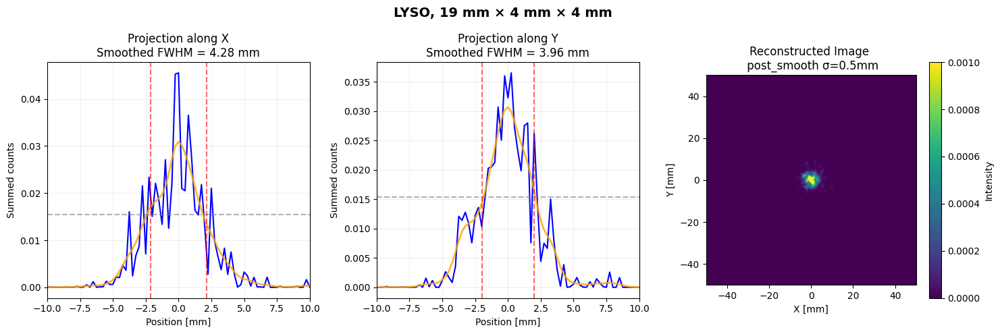

In [149]:
fig, axes = plt.subplots(1,3,figsize=(15,5))
fwhm_x, fwhm_y = plot_1d_fwhm(all_data[0][0][0][0,:], axes=axes,shift_in_mm=0)
plot_2d_image(all_data[0][0][0][0,:],fig=fig, ax=axes[2],vmax=1e-3)
fig.suptitle("LYSO, 19 mm × 4 mm × 4 mm", fontsize=14, fontweight="bold", y=0.98)

plt.tight_layout()
plt.show()

[Direct] FWHM_x = 0.31 mm
[Direct] FWHM_y = 0.35 mm


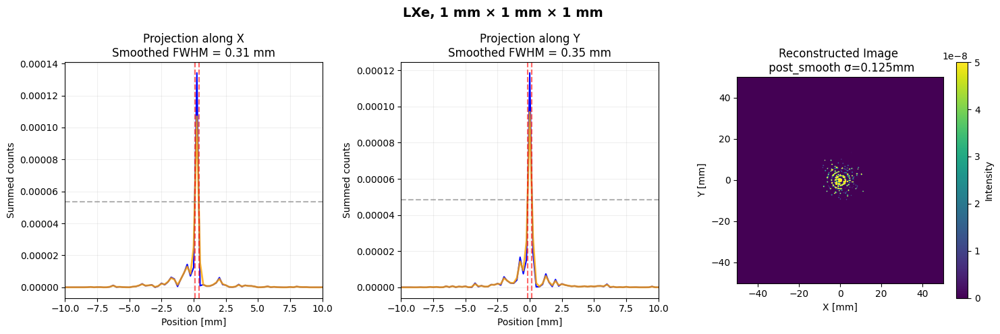

In [150]:
fig, axes = plt.subplots(1,3,figsize=(15,5))
plot_1d_fwhm(all_data[1][2][0][0,:], axes=axes, smooth_sigma=0.5, shift_in_mm=0)
plot_2d_image(all_data[1][2][0][0,:],fig=fig, ax=axes[2],vmax=5e-8,smooth_sigma=0.5)
fig.suptitle("LXe, 1 mm × 1 mm × 1 mm", fontsize=14, fontweight="bold", y=0.98)

plt.tight_layout()
plt.show()

In [151]:
import numpy as np
import matplotlib.pyplot as plt

# ==============================================================
# Configurations
# ==============================================================
fwhm_results = np.full((len(MATERIALS), len(CRYSTAL_OPTIONS), len(SOURCE_DISTS), 2),
                       np.nan, dtype=np.float32)

SMOOTH_SIGMA_MAP = {
    "original": 2.0,
    "fine": 1.0,
    "super_fine": 0.5
}

CRYSTAL_SIZE_MAP = {
    "original": "19 mm × 4 mm × 4 mm",
    "fine": "1 mm × 2 mm × 2 mm",
    "super_fine": "1 mm × 1 mm × 1 mm"
}

[Direct] FWHM_x = 4.28 mm
[Direct] FWHM_y = 3.96 mm


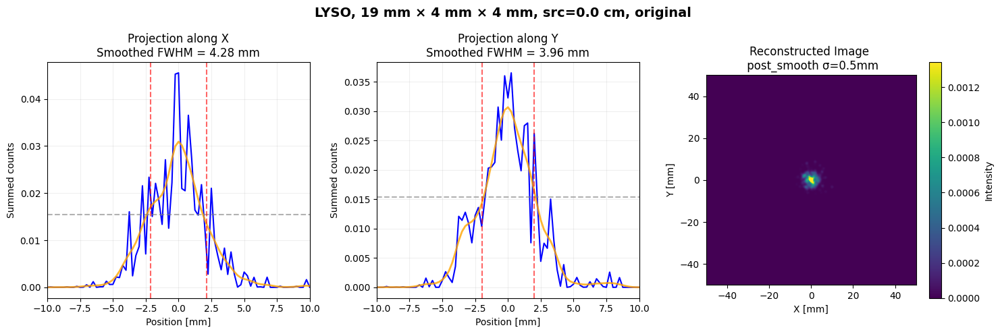

[Direct] FWHM_x = 3.59 mm
[Direct] FWHM_y = 3.63 mm


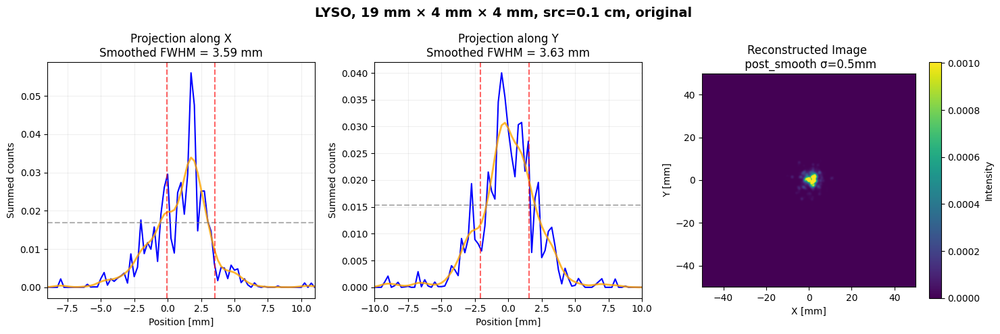

[Direct] FWHM_x = 2.55 mm
[Direct] FWHM_y = 3.39 mm


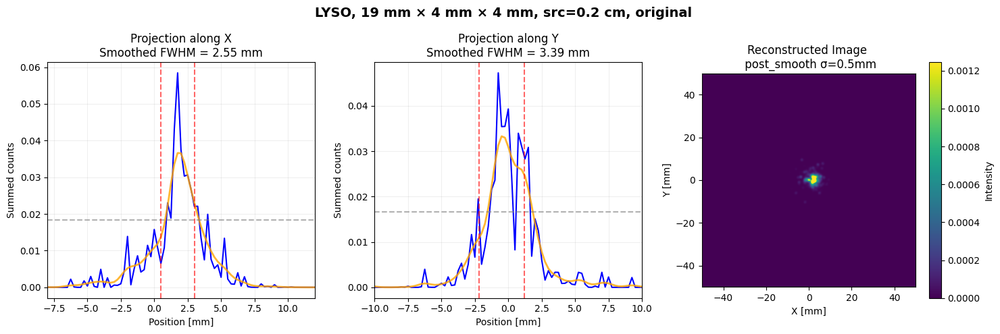

[Direct] FWHM_x = 4.14 mm
[Direct] FWHM_y = 3.48 mm


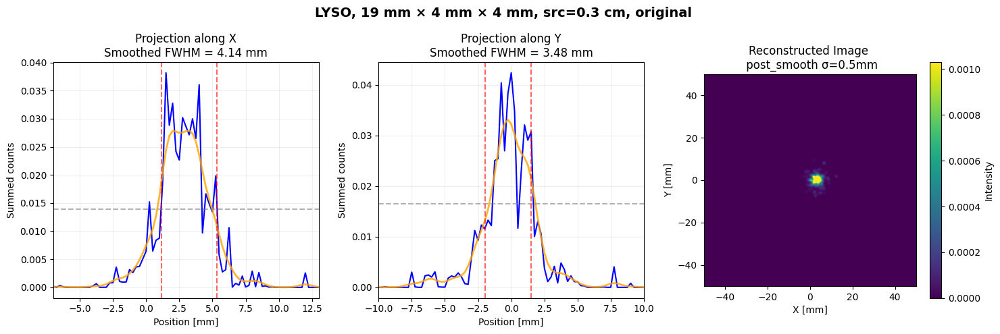

[Direct] FWHM_x = 3.89 mm
[Direct] FWHM_y = 3.52 mm


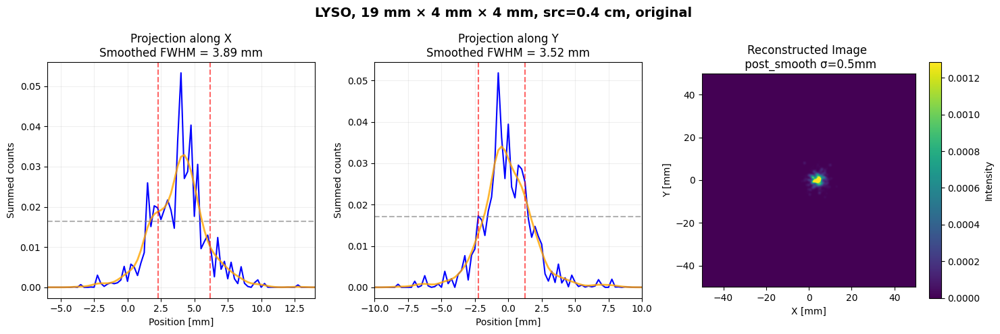

[Direct] FWHM_x = 3.59 mm
[Direct] FWHM_y = 3.69 mm


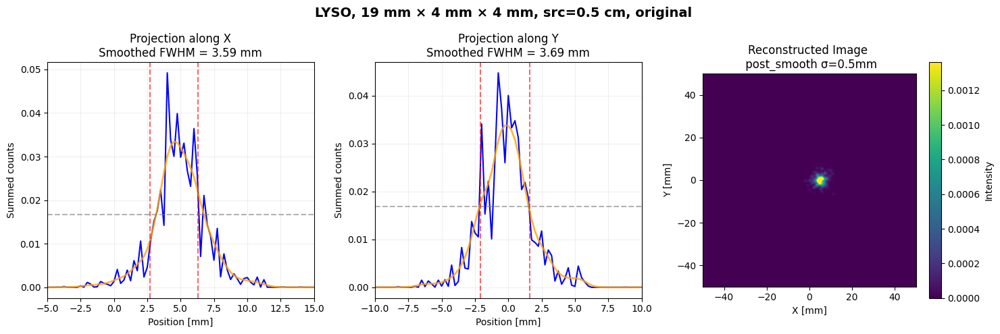

[Direct] FWHM_x = 3.85 mm
[Direct] FWHM_y = 3.07 mm


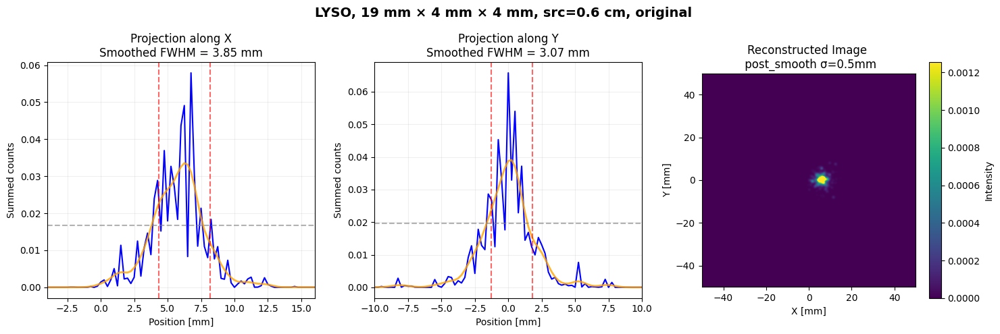

[Direct] FWHM_x = 3.43 mm
[Direct] FWHM_y = 3.49 mm


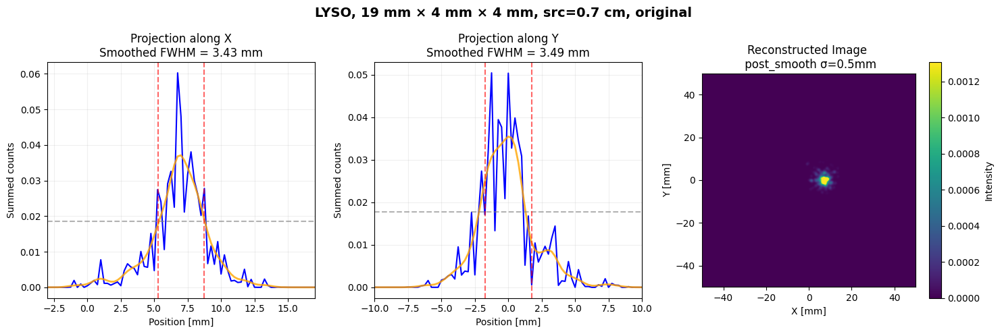

[Direct] FWHM_x = 3.50 mm
[Direct] FWHM_y = 3.60 mm


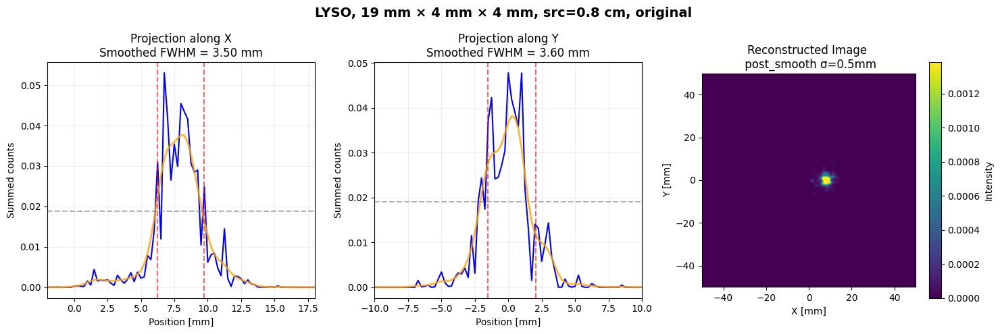

[Direct] FWHM_x = 3.83 mm
[Direct] FWHM_y = 3.24 mm


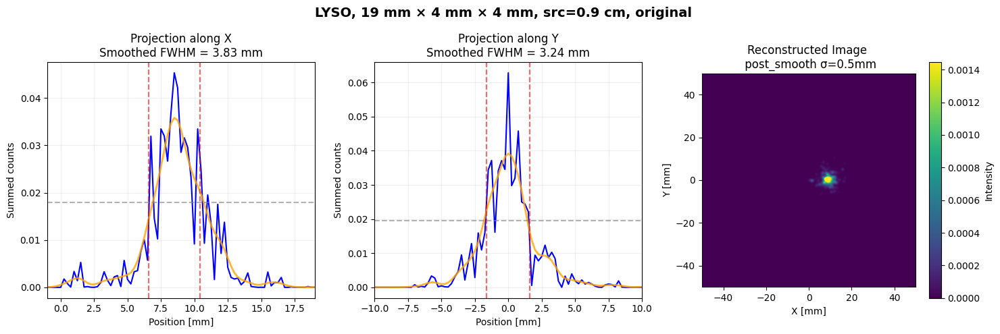

[Direct] FWHM_x = 4.22 mm
[Direct] FWHM_y = 3.35 mm


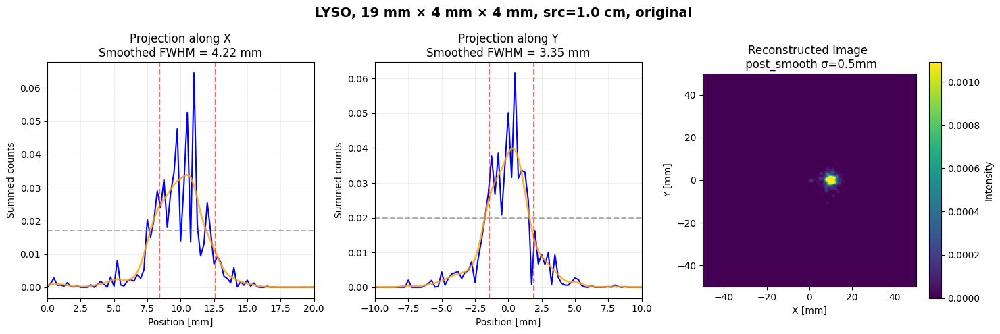

[Direct] FWHM_x = 4.14 mm
[Direct] FWHM_y = 3.60 mm


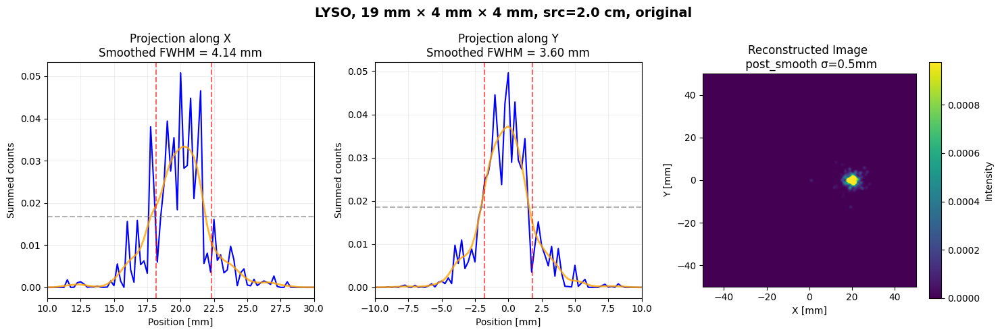

[Direct] FWHM_x = 3.55 mm
[Direct] FWHM_y = 3.61 mm


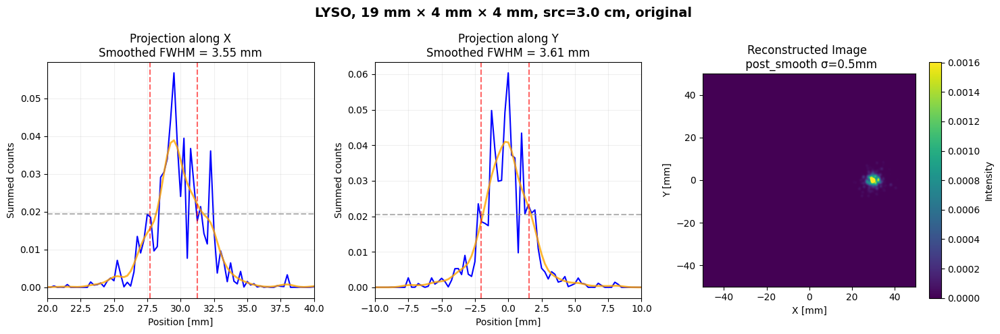

[Direct] FWHM_x = 4.34 mm
[Direct] FWHM_y = 3.60 mm


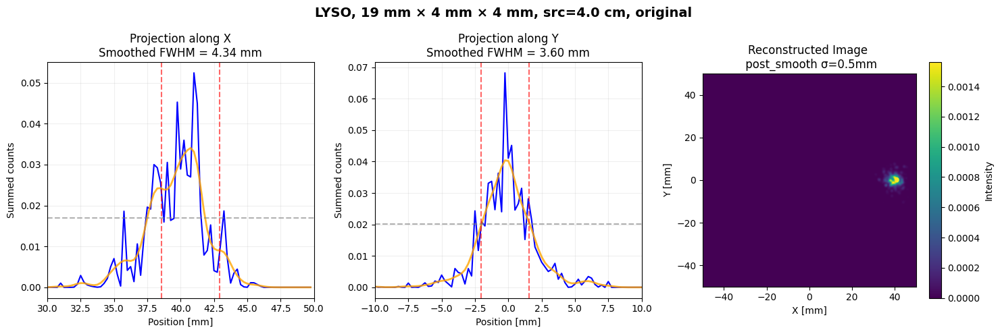

[Direct] FWHM_x = nan mm
[Direct] FWHM_y = 4.38 mm


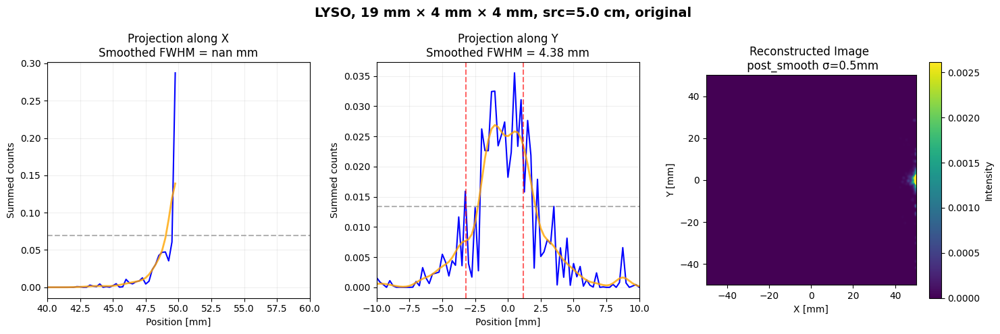

[Direct] FWHM_x = 1.26 mm
[Direct] FWHM_y = 1.17 mm


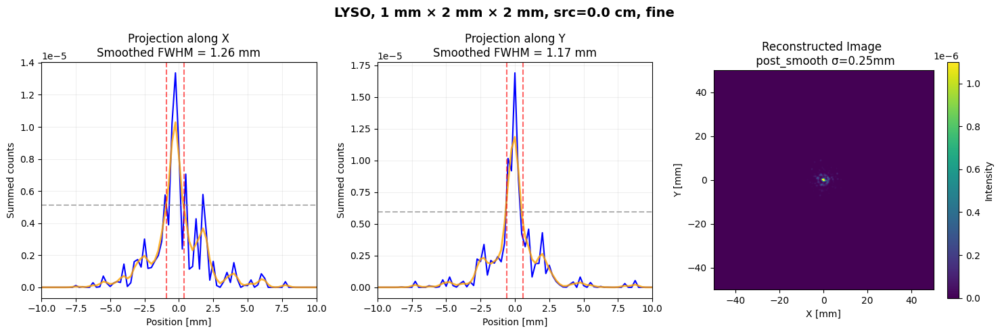

[Direct] FWHM_x = 0.87 mm
[Direct] FWHM_y = 1.53 mm


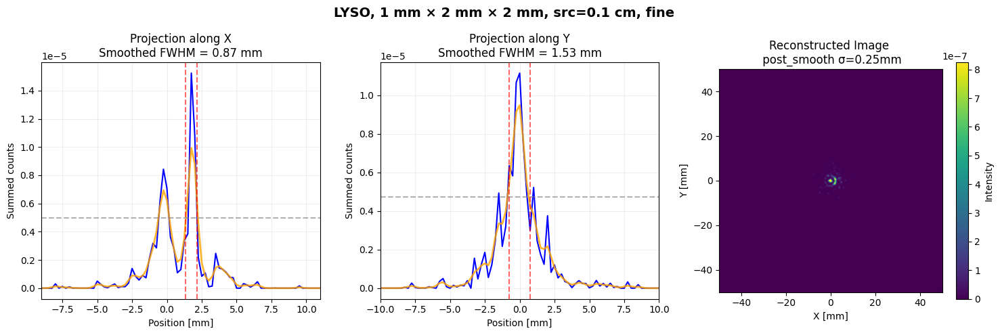

[Direct] FWHM_x = 0.87 mm
[Direct] FWHM_y = 1.24 mm


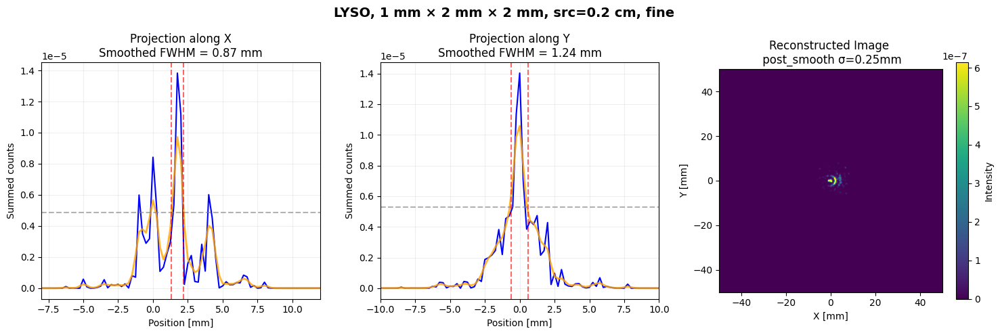

[Direct] FWHM_x = 1.11 mm
[Direct] FWHM_y = 1.57 mm


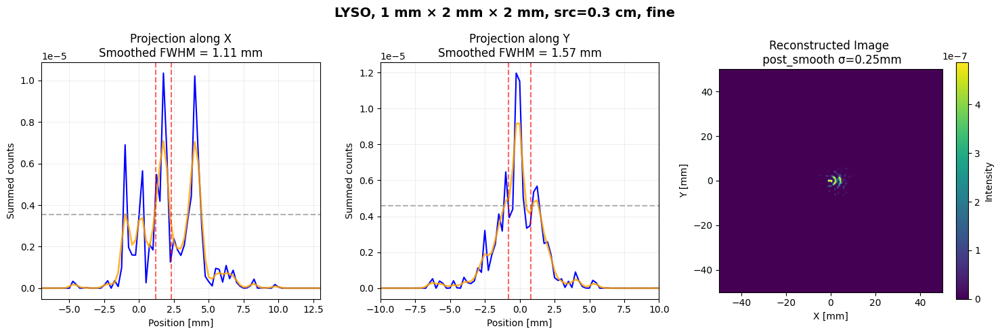

[Direct] FWHM_x = 0.94 mm
[Direct] FWHM_y = 2.21 mm


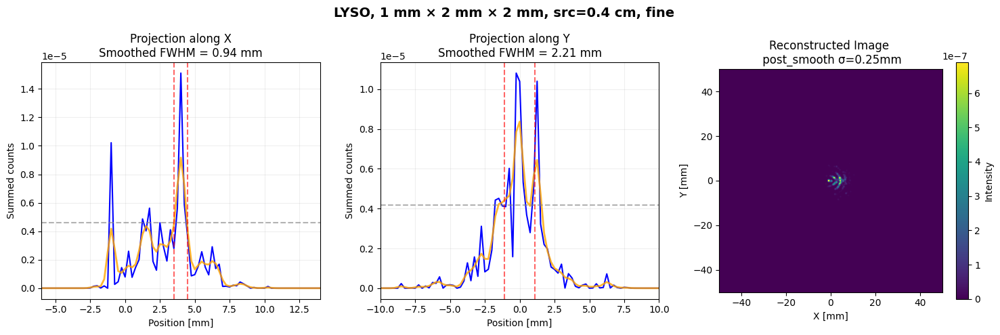

[Direct] FWHM_x = 1.11 mm
[Direct] FWHM_y = 2.82 mm


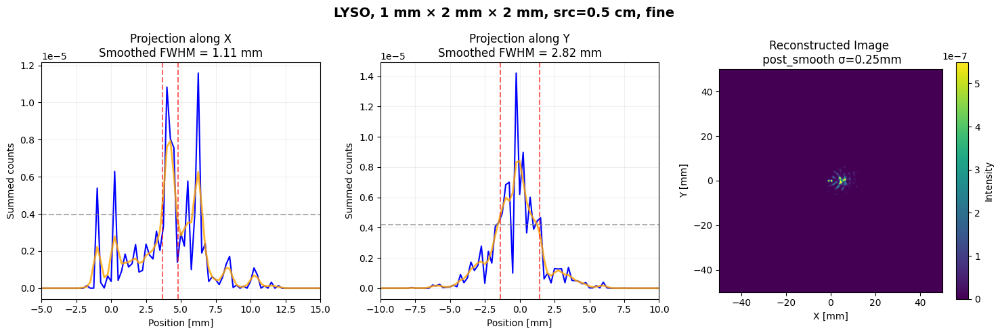

[Direct] FWHM_x = 3.20 mm
[Direct] FWHM_y = 3.02 mm


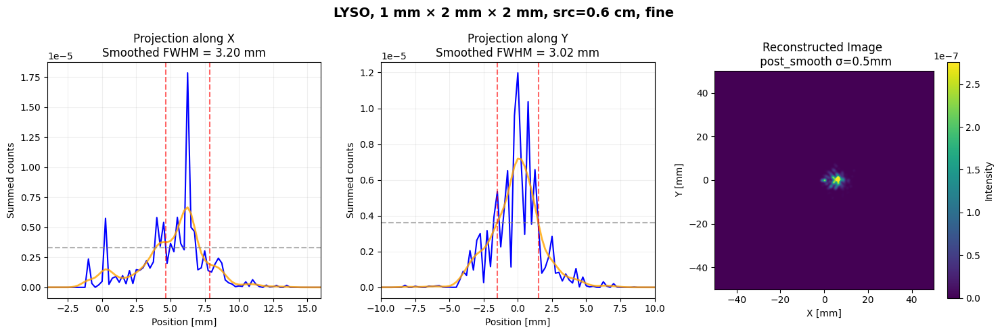

[Direct] FWHM_x = 3.88 mm
[Direct] FWHM_y = 3.31 mm


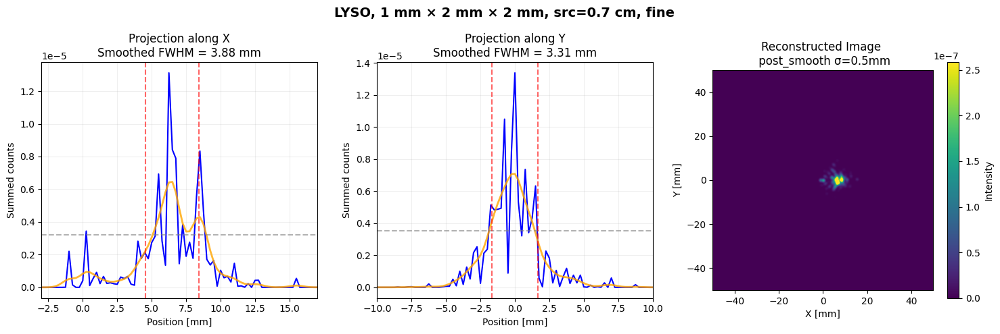

[Direct] FWHM_x = 3.41 mm
[Direct] FWHM_y = 3.08 mm


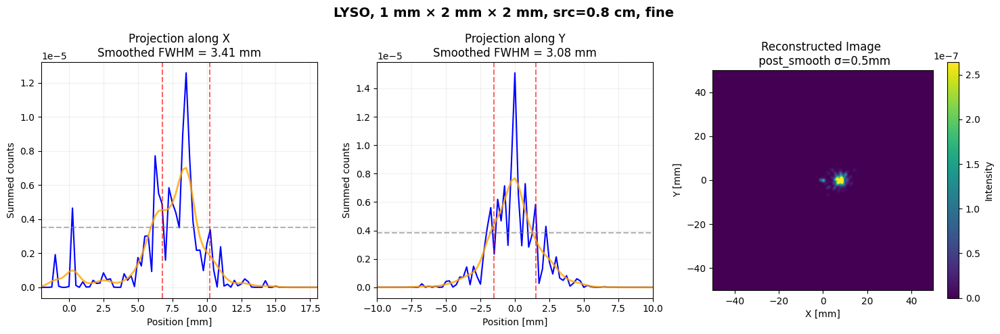

[Direct] FWHM_x = 3.19 mm
[Direct] FWHM_y = 2.83 mm


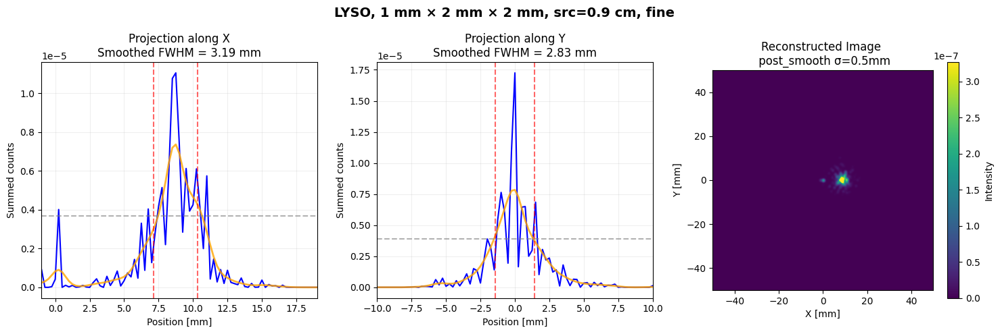

[Direct] FWHM_x = 3.58 mm
[Direct] FWHM_y = 3.01 mm


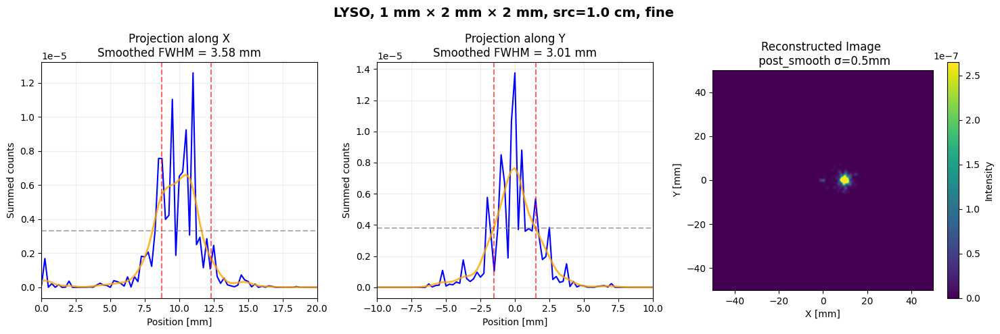

[Direct] FWHM_x = 3.93 mm
[Direct] FWHM_y = 3.70 mm


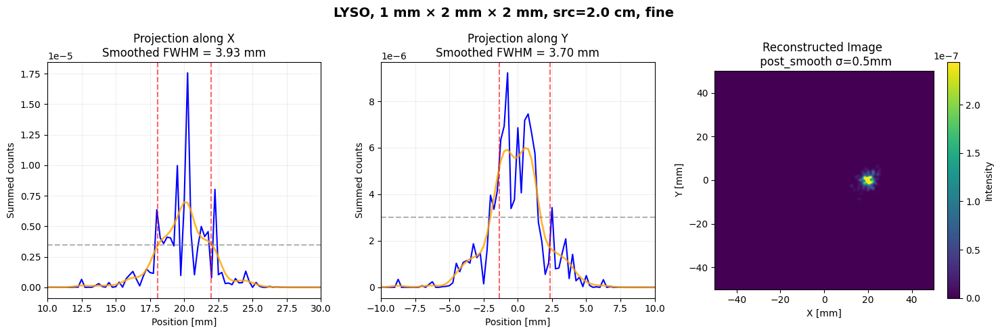

[Direct] FWHM_x = 3.25 mm
[Direct] FWHM_y = 2.85 mm


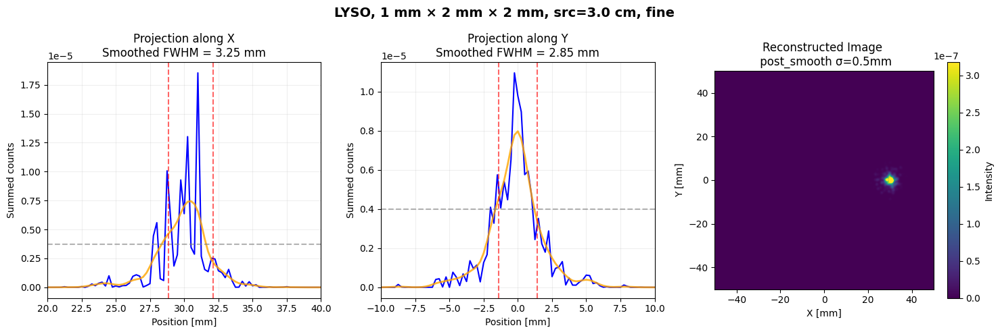

[Direct] FWHM_x = 2.13 mm
[Direct] FWHM_y = 3.60 mm


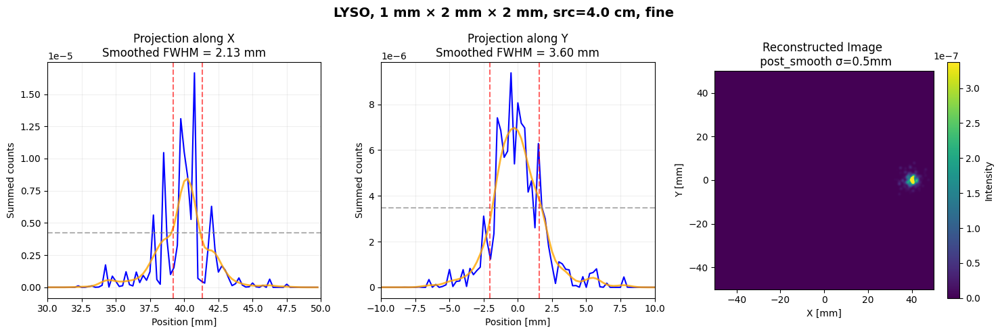

[Direct] FWHM_x = nan mm
[Direct] FWHM_y = 3.43 mm


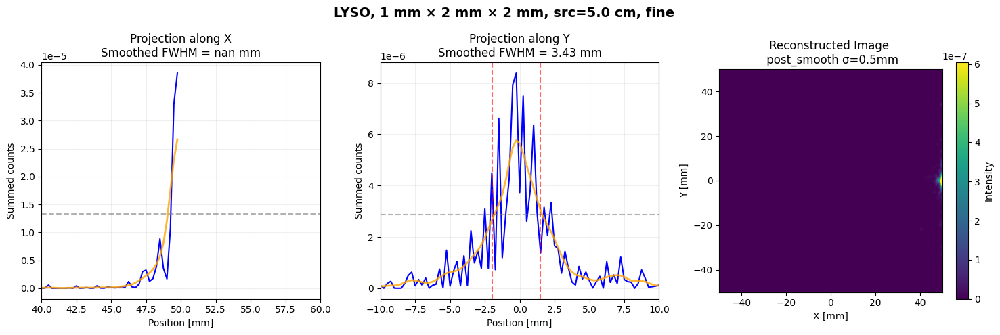

[Direct] FWHM_x = 0.31 mm
[Direct] FWHM_y = 0.34 mm


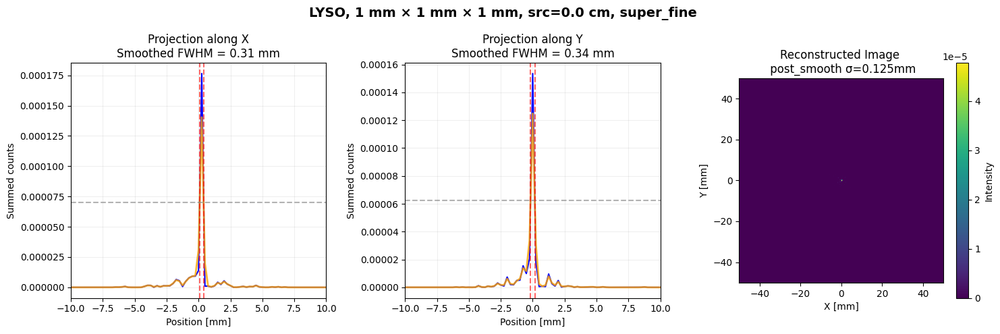

[Direct] FWHM_x = 0.31 mm
[Direct] FWHM_y = 0.37 mm


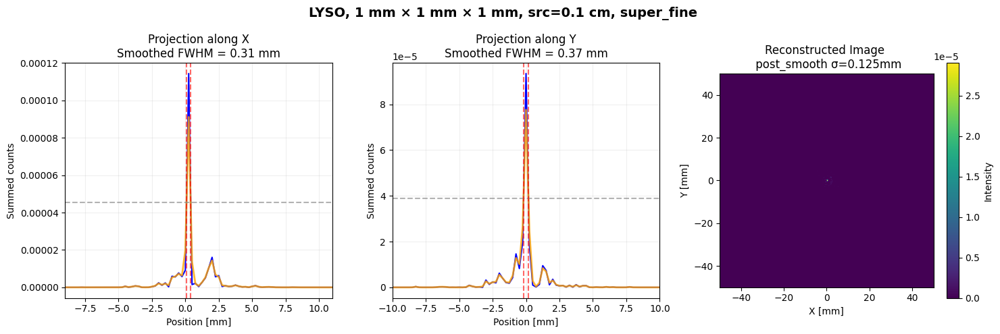

[Direct] FWHM_x = 0.30 mm
[Direct] FWHM_y = 0.38 mm


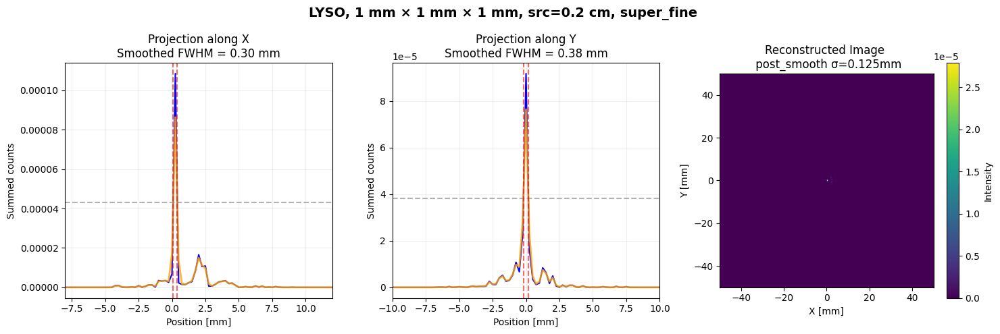

[Direct] FWHM_x = 0.30 mm
[Direct] FWHM_y = 0.40 mm


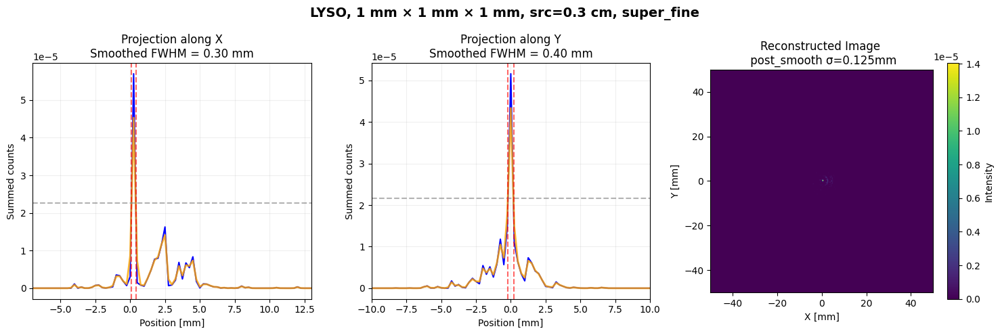

[Direct] FWHM_x = 0.30 mm
[Direct] FWHM_y = 0.39 mm


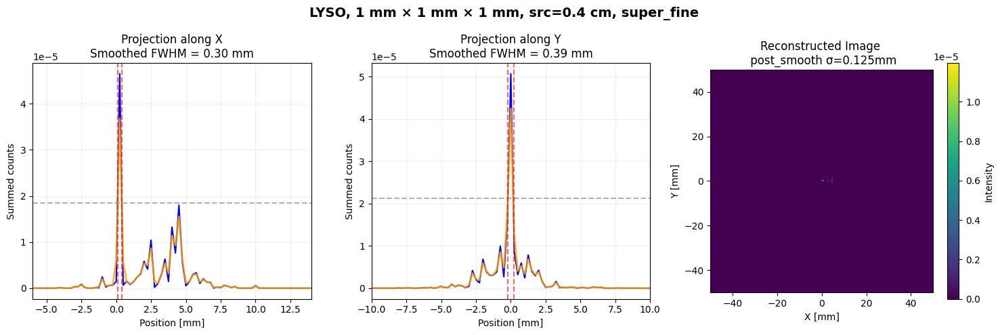

[Direct] FWHM_x = 0.42 mm
[Direct] FWHM_y = 0.64 mm


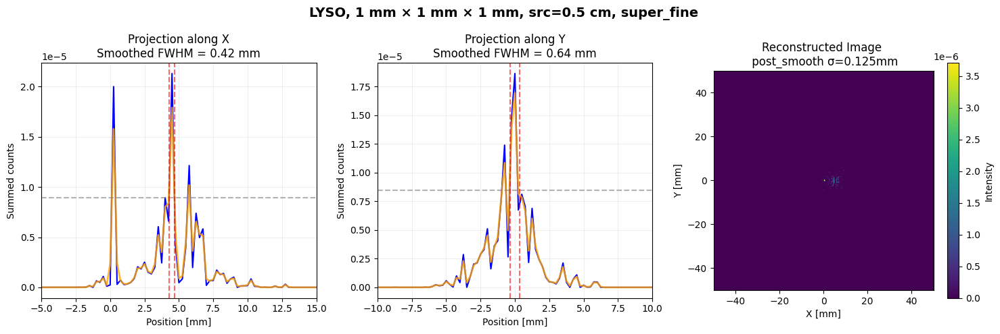

[Direct] FWHM_x = 2.78 mm
[Direct] FWHM_y = 2.02 mm


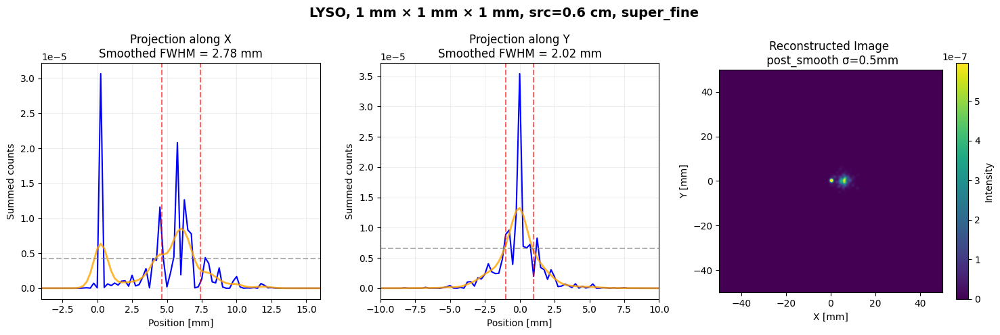

[Direct] FWHM_x = 3.39 mm
[Direct] FWHM_y = 2.80 mm


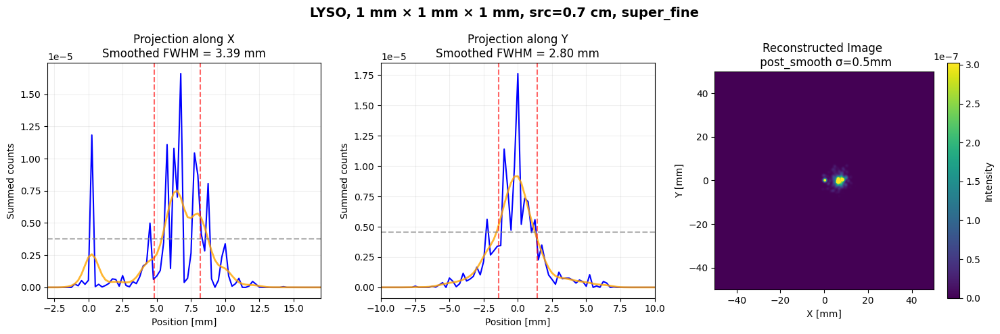

[Direct] FWHM_x = 2.47 mm
[Direct] FWHM_y = 3.41 mm


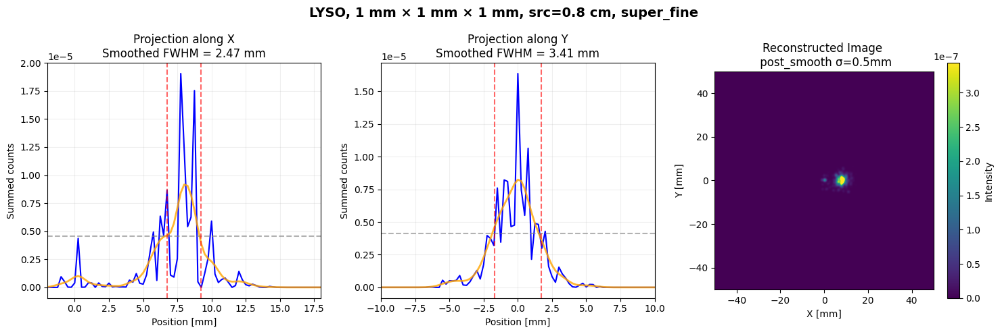

[Direct] FWHM_x = 3.39 mm
[Direct] FWHM_y = 2.07 mm


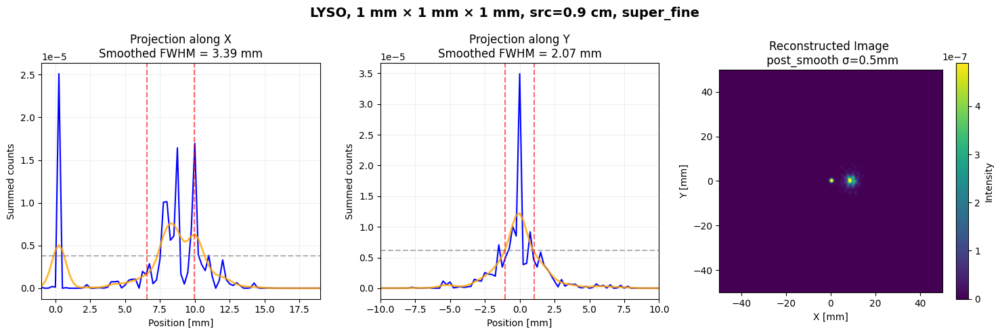

[Direct] FWHM_x = 2.56 mm
[Direct] FWHM_y = 3.13 mm


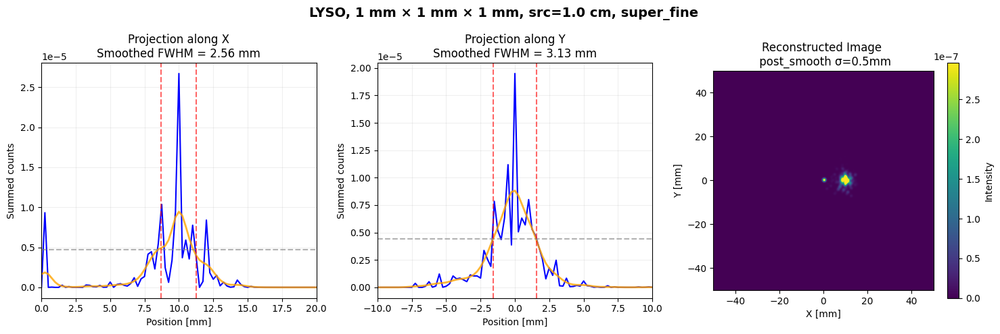

[Direct] FWHM_x = 3.36 mm
[Direct] FWHM_y = 3.54 mm


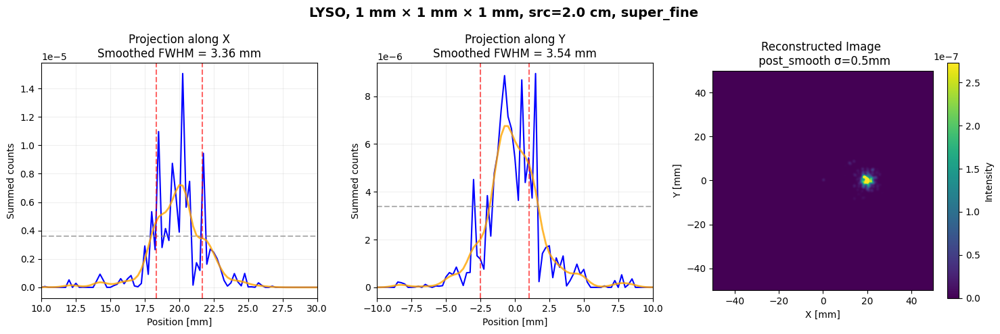

[Direct] FWHM_x = 3.01 mm
[Direct] FWHM_y = 3.30 mm


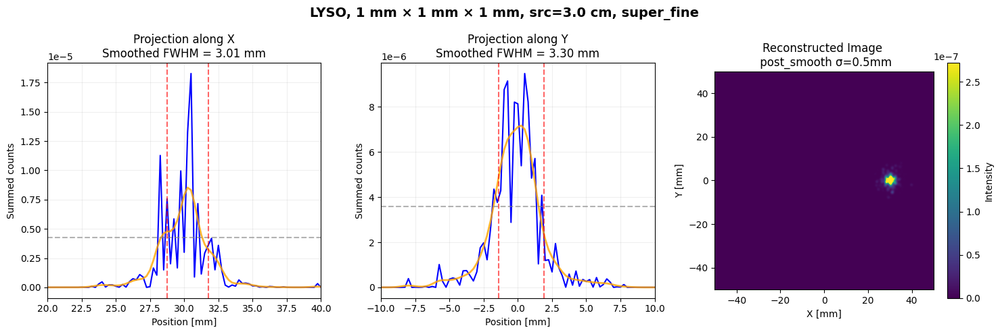

[Direct] FWHM_x = 2.77 mm
[Direct] FWHM_y = 2.83 mm


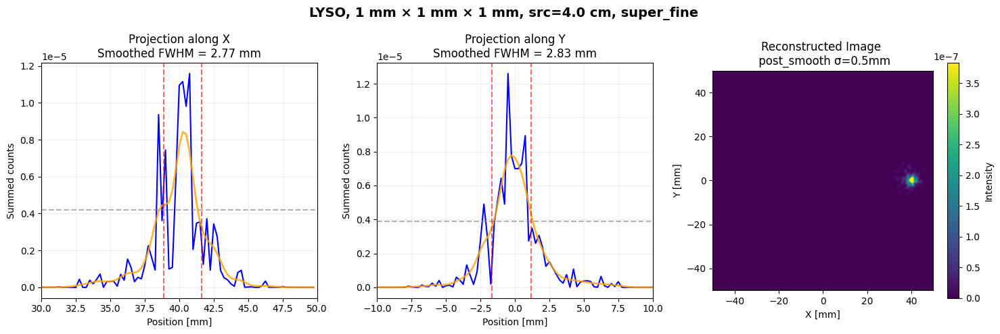

[Direct] FWHM_x = nan mm
[Direct] FWHM_y = 3.47 mm


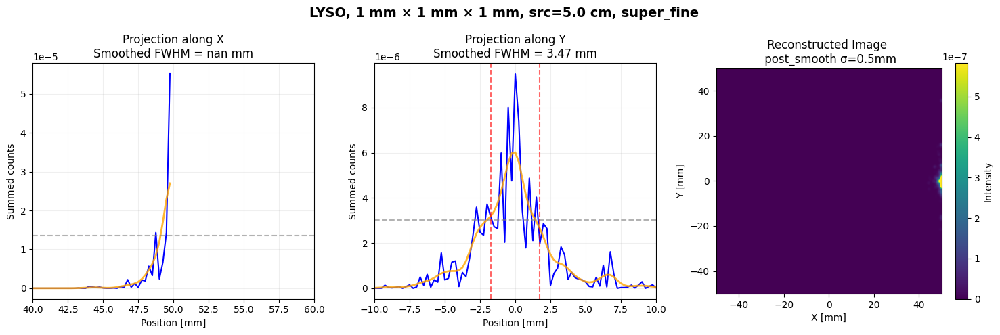

[Direct] FWHM_x = 4.28 mm
[Direct] FWHM_y = 4.03 mm


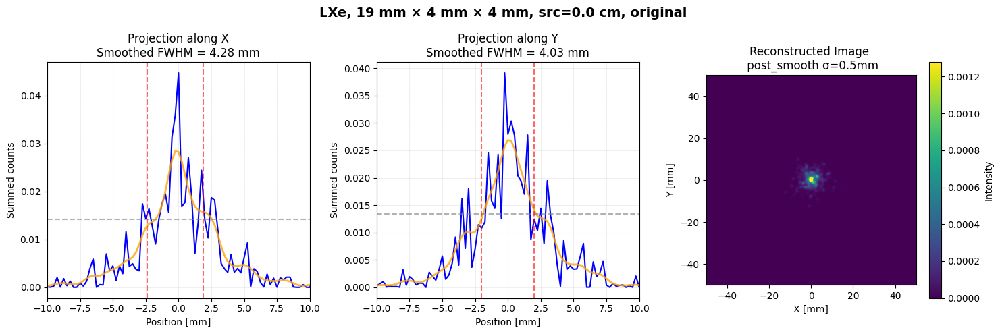

[Direct] FWHM_x = 4.75 mm
[Direct] FWHM_y = 4.89 mm


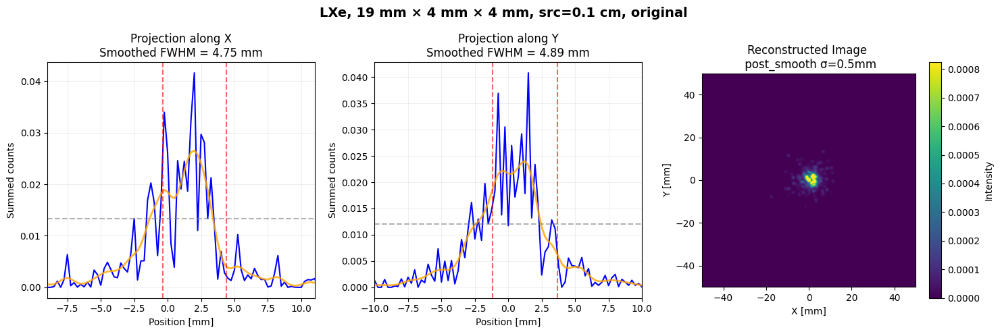

[Direct] FWHM_x = 3.46 mm
[Direct] FWHM_y = 3.25 mm


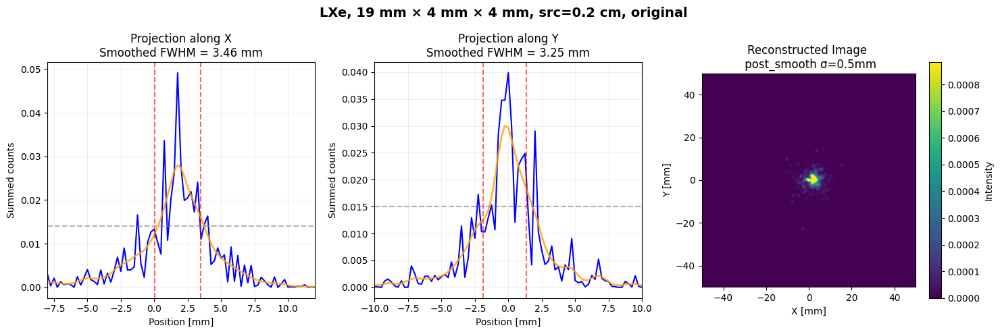

[Direct] FWHM_x = 4.96 mm
[Direct] FWHM_y = 3.99 mm


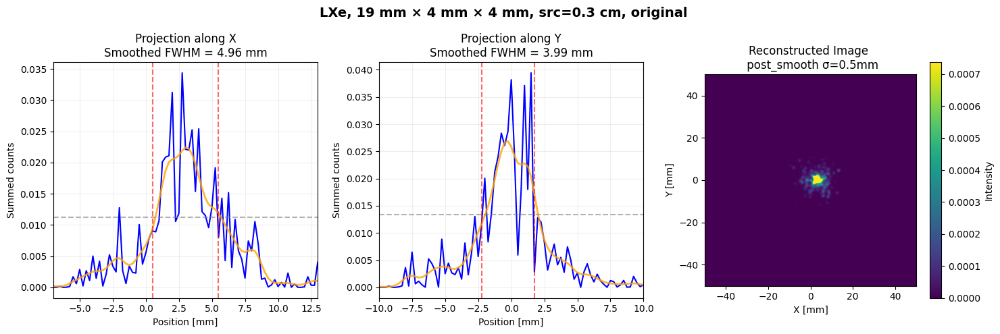

[Direct] FWHM_x = 4.70 mm
[Direct] FWHM_y = 3.45 mm


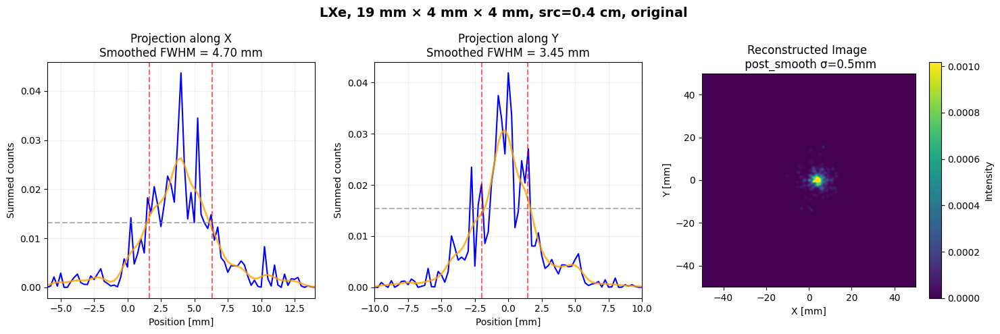

[Direct] FWHM_x = 4.12 mm
[Direct] FWHM_y = 3.30 mm


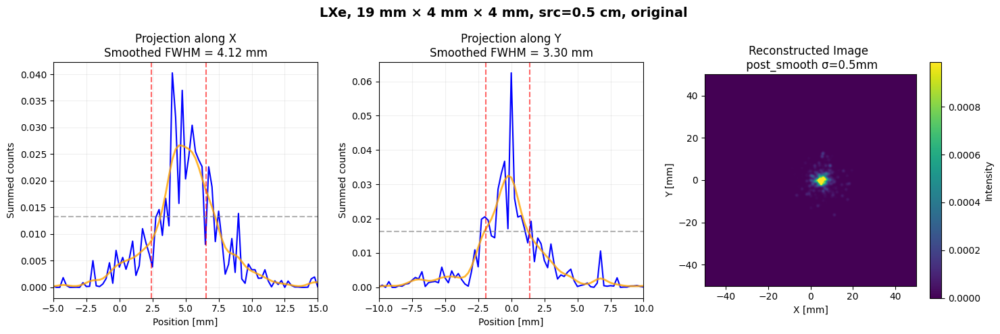

[Direct] FWHM_x = 4.39 mm
[Direct] FWHM_y = 3.98 mm


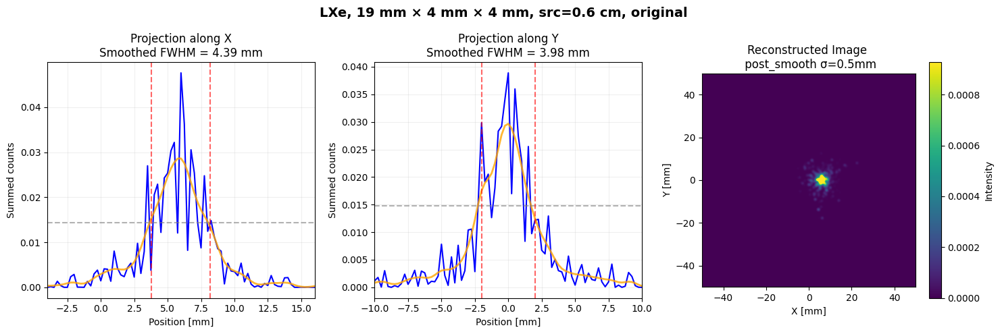

[Direct] FWHM_x = 4.06 mm
[Direct] FWHM_y = 3.69 mm


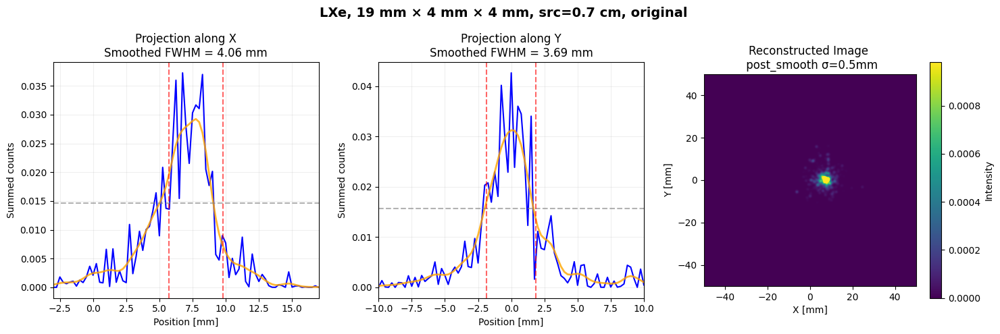

[Direct] FWHM_x = 3.17 mm
[Direct] FWHM_y = 3.45 mm


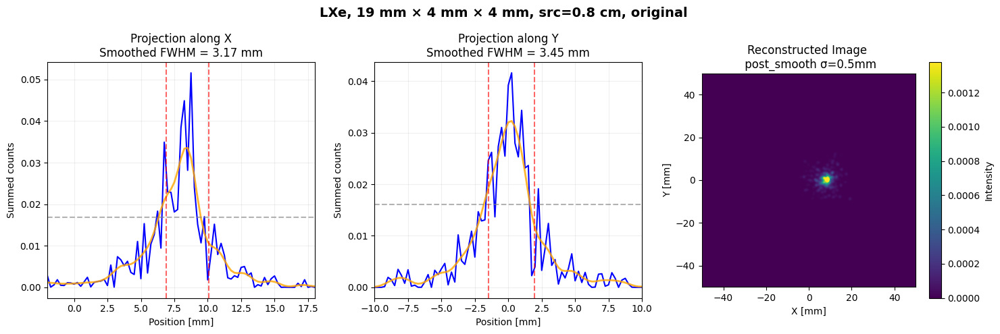

[Direct] FWHM_x = 4.00 mm
[Direct] FWHM_y = 3.75 mm


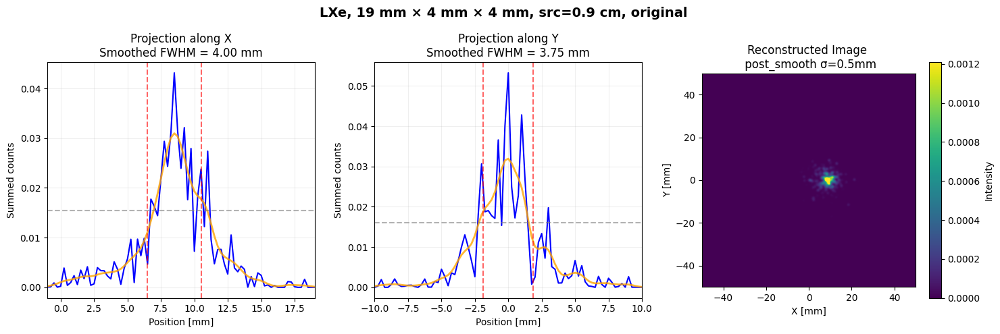

[Direct] FWHM_x = 5.05 mm
[Direct] FWHM_y = 3.79 mm


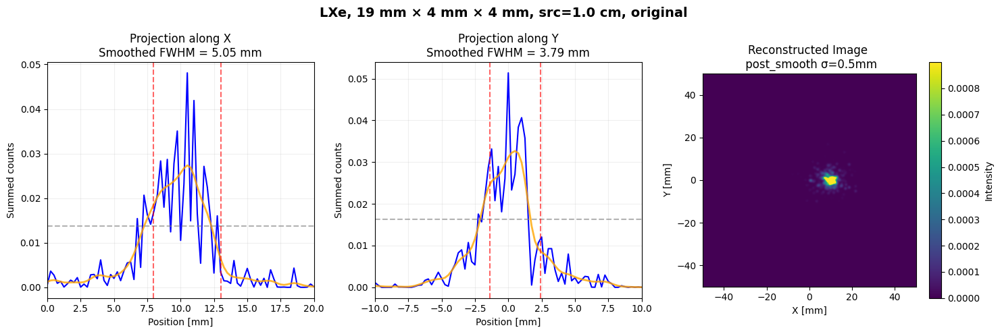

[Direct] FWHM_x = 4.49 mm
[Direct] FWHM_y = 3.38 mm


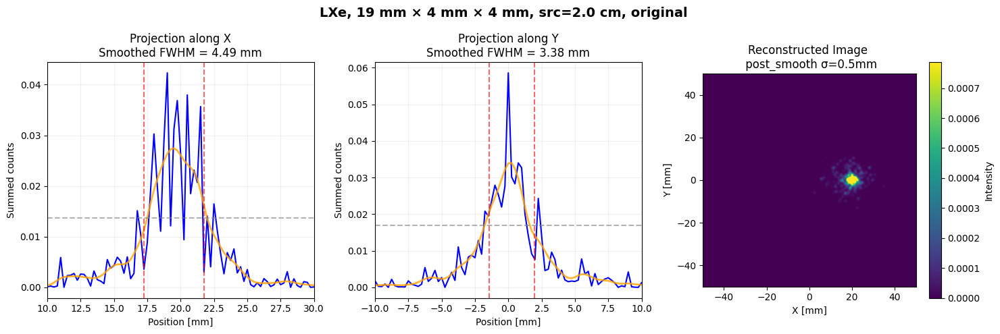

[Direct] FWHM_x = 3.50 mm
[Direct] FWHM_y = 3.53 mm


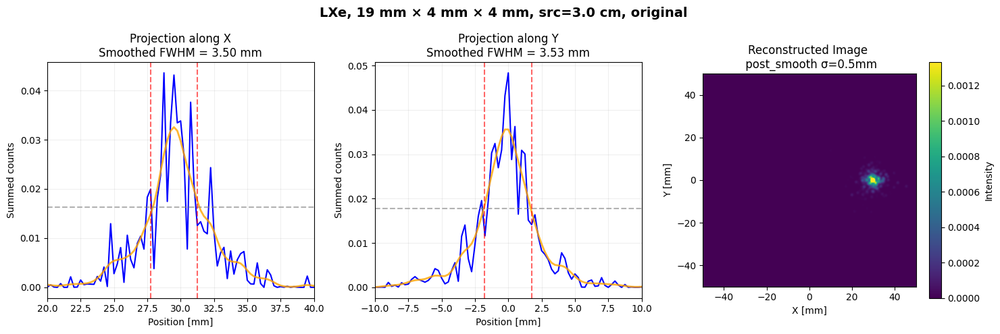

[Direct] FWHM_x = 4.88 mm
[Direct] FWHM_y = 3.79 mm


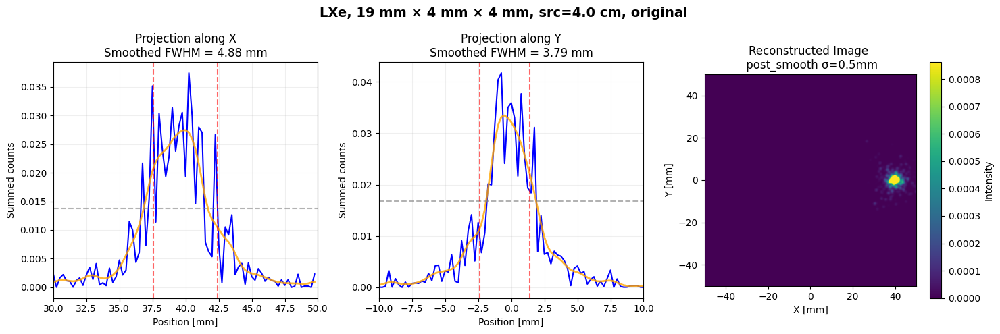

[Direct] FWHM_x = nan mm
[Direct] FWHM_y = 3.73 mm


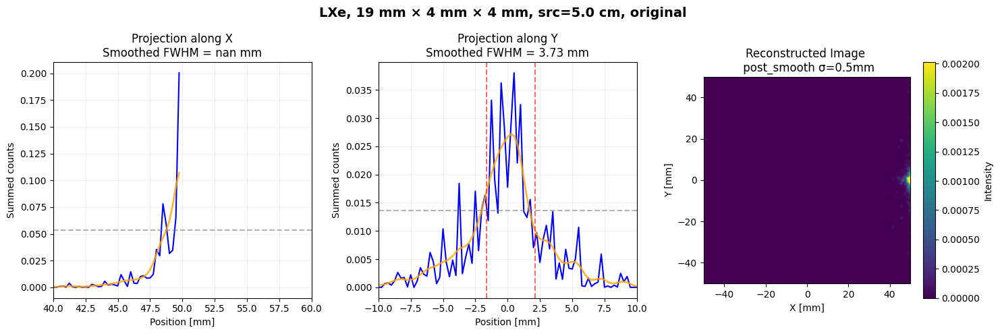

[Direct] FWHM_x = 1.16 mm
[Direct] FWHM_y = 1.02 mm


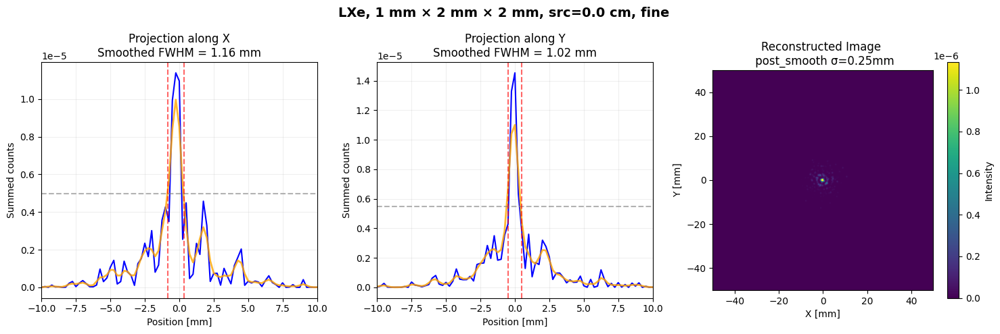

[Direct] FWHM_x = 0.97 mm
[Direct] FWHM_y = 1.08 mm


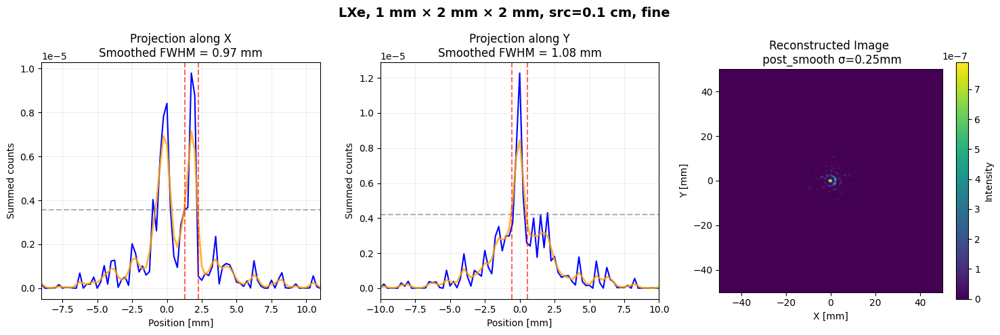

[Direct] FWHM_x = 0.91 mm
[Direct] FWHM_y = 1.10 mm


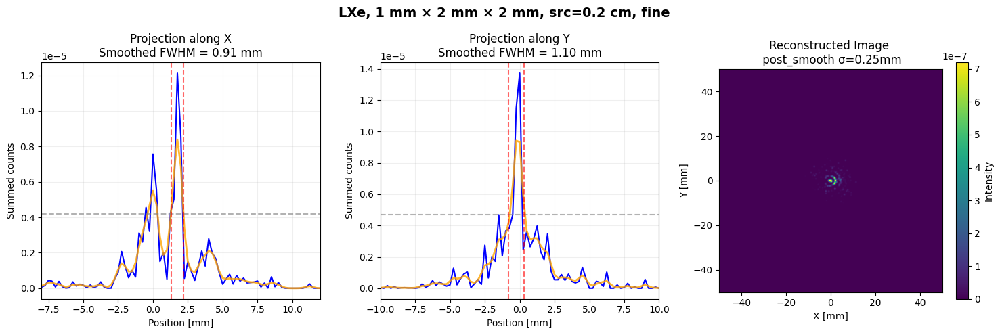

[Direct] FWHM_x = 1.06 mm
[Direct] FWHM_y = 3.02 mm


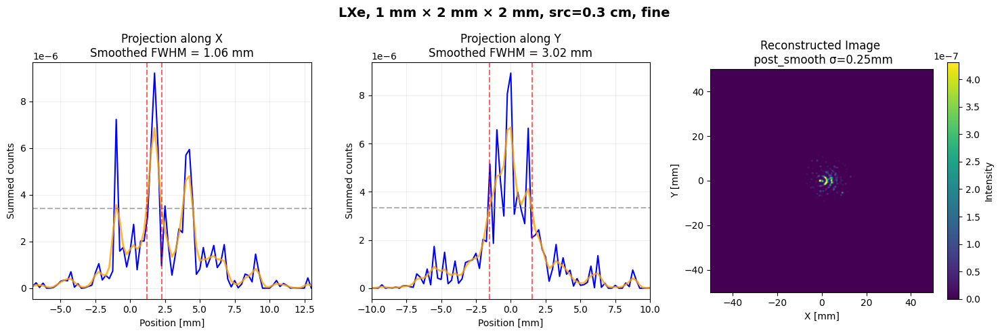

[Direct] FWHM_x = 0.95 mm
[Direct] FWHM_y = 1.76 mm


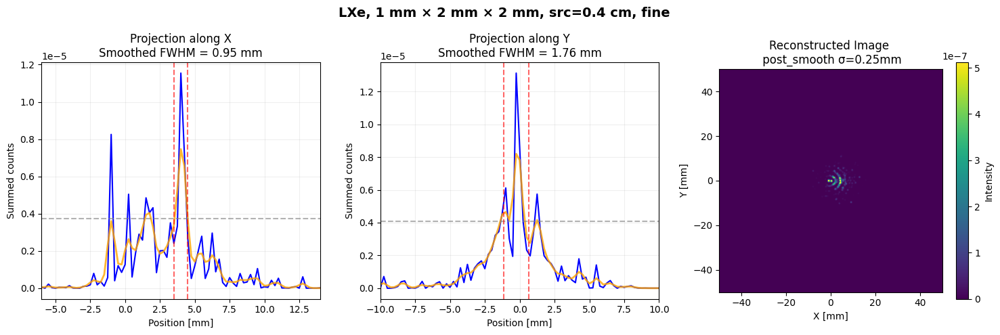

[Direct] FWHM_x = 1.09 mm
[Direct] FWHM_y = 2.78 mm


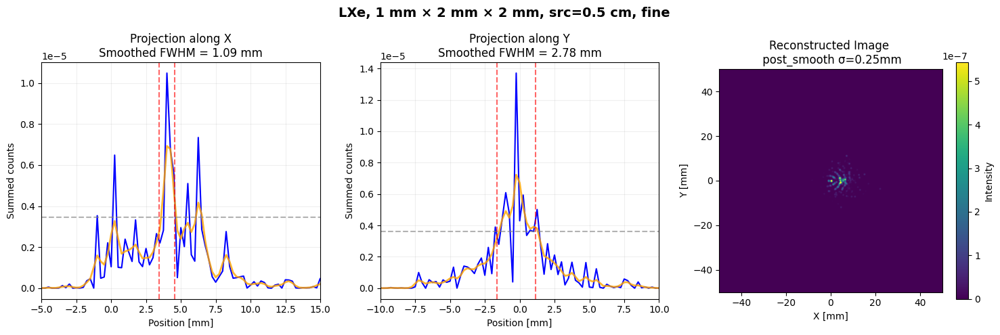

[Direct] FWHM_x = 3.05 mm
[Direct] FWHM_y = 3.45 mm


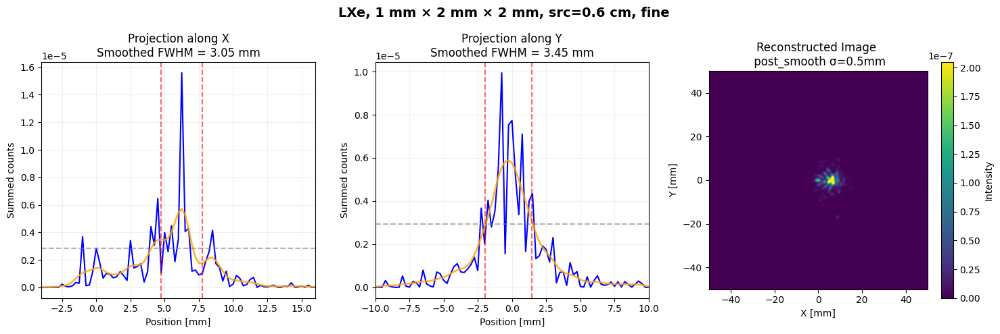

[Direct] FWHM_x = 3.62 mm
[Direct] FWHM_y = 3.02 mm


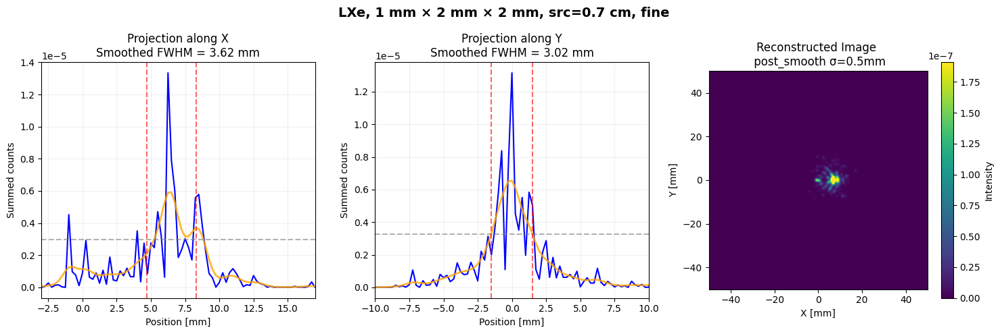

[Direct] FWHM_x = 3.11 mm
[Direct] FWHM_y = 3.41 mm


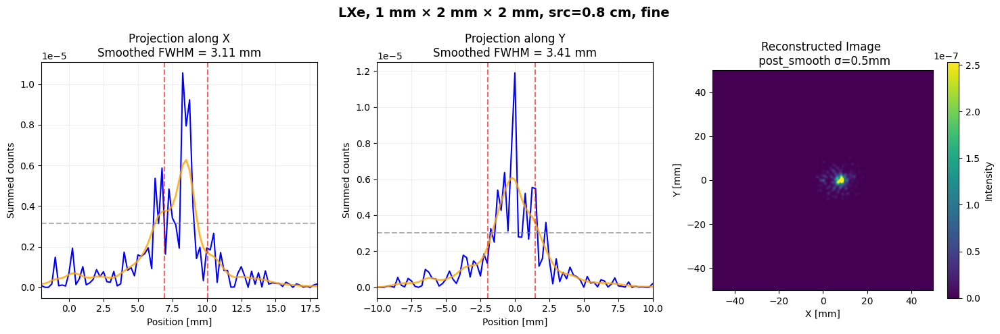

[Direct] FWHM_x = 3.29 mm
[Direct] FWHM_y = 2.54 mm


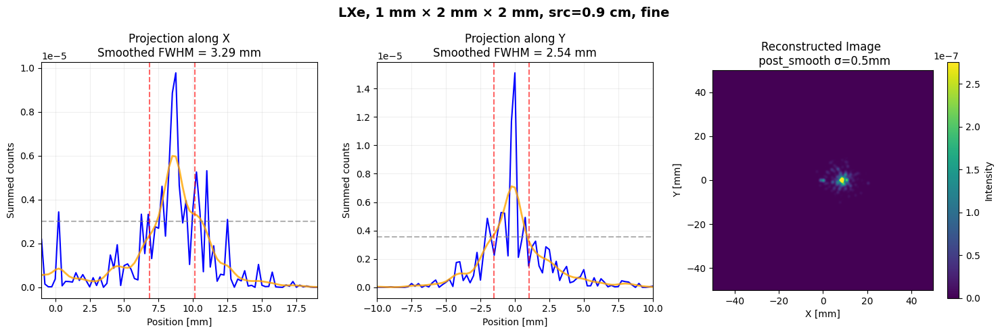

[Direct] FWHM_x = 3.39 mm
[Direct] FWHM_y = 3.04 mm


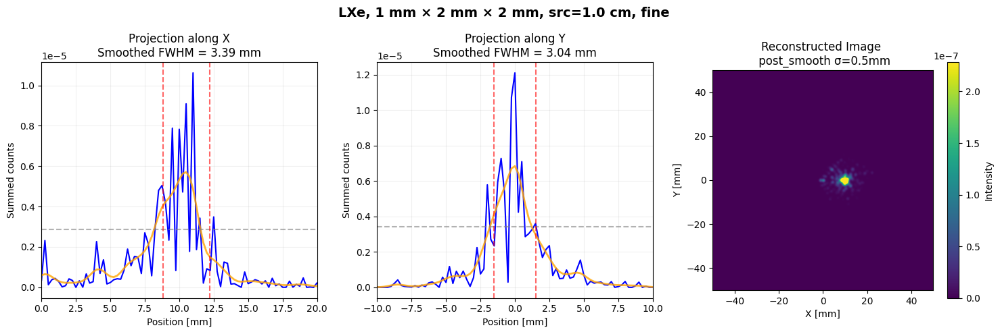

[Direct] FWHM_x = 2.93 mm
[Direct] FWHM_y = 3.55 mm


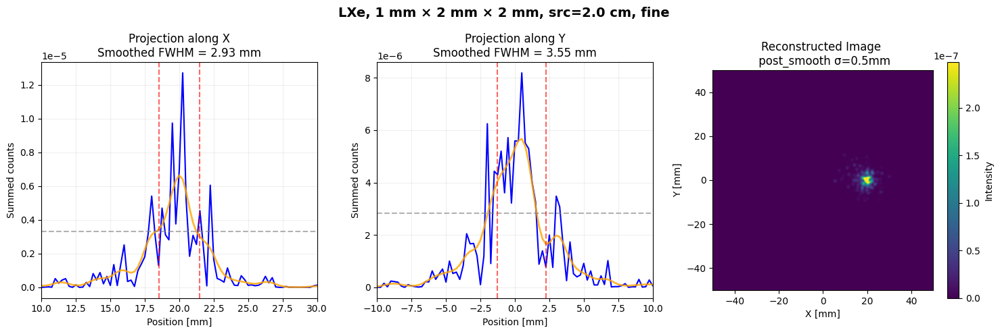

[Direct] FWHM_x = 3.98 mm
[Direct] FWHM_y = 3.06 mm


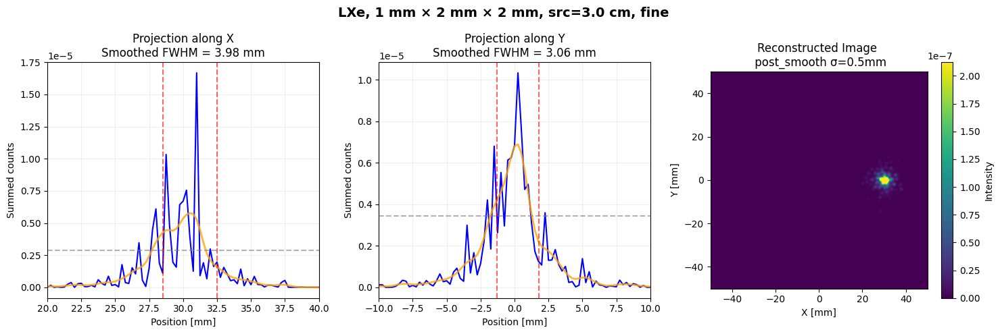

[Direct] FWHM_x = 2.21 mm
[Direct] FWHM_y = 3.36 mm


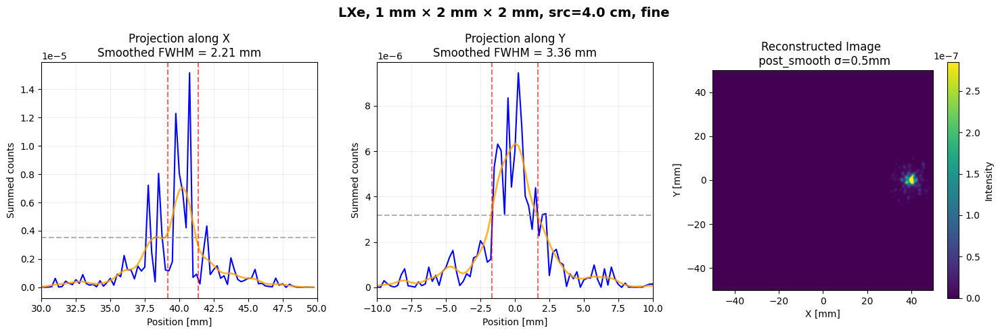

[Direct] FWHM_x = nan mm
[Direct] FWHM_y = 4.38 mm


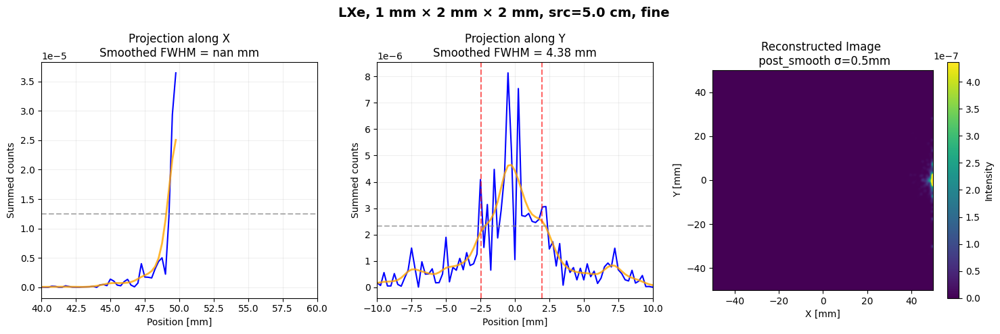

[Direct] FWHM_x = 0.31 mm
[Direct] FWHM_y = 0.35 mm


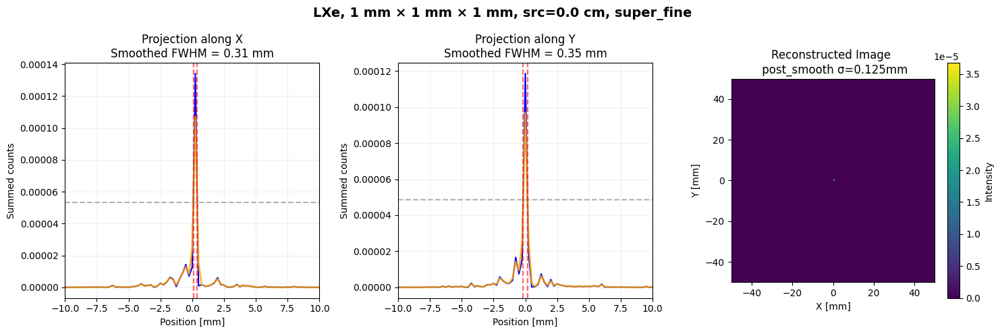

[Direct] FWHM_x = 0.31 mm
[Direct] FWHM_y = 0.35 mm


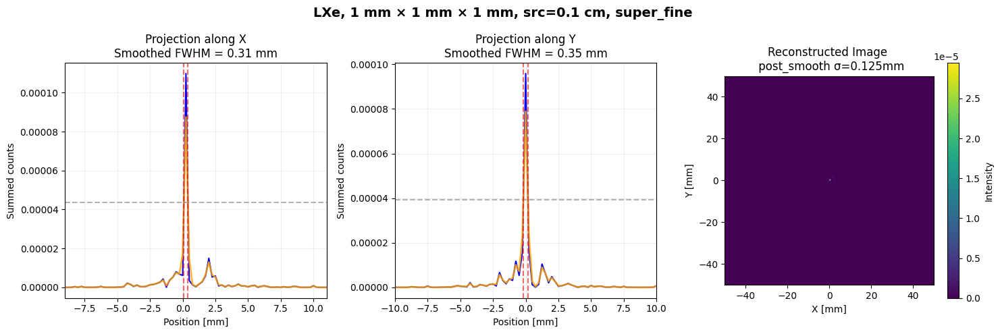

[Direct] FWHM_x = 0.30 mm
[Direct] FWHM_y = 0.36 mm


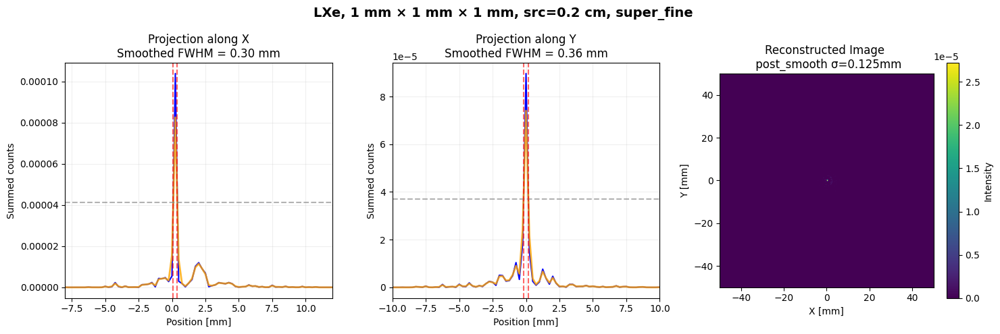

[Direct] FWHM_x = 0.30 mm
[Direct] FWHM_y = 0.37 mm


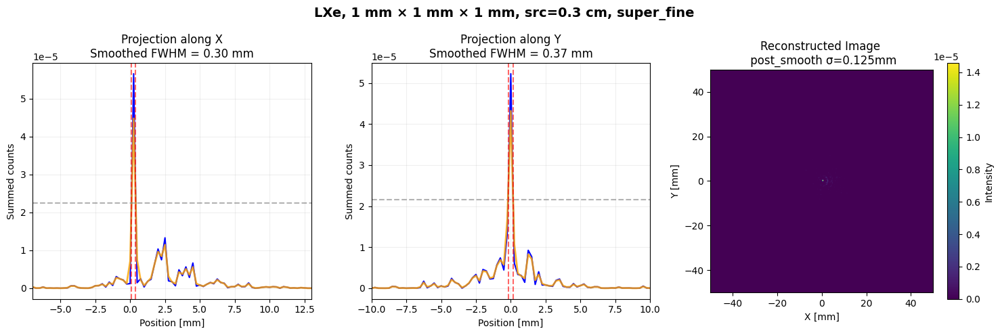

[Direct] FWHM_x = 0.30 mm
[Direct] FWHM_y = 0.36 mm


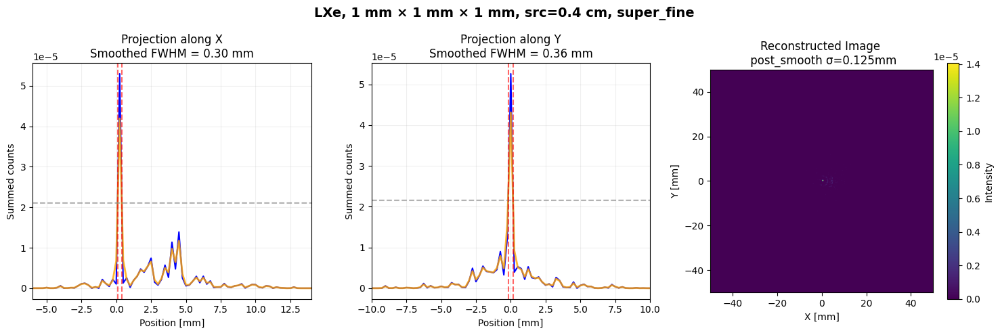

[Direct] FWHM_x = 0.30 mm
[Direct] FWHM_y = 0.37 mm


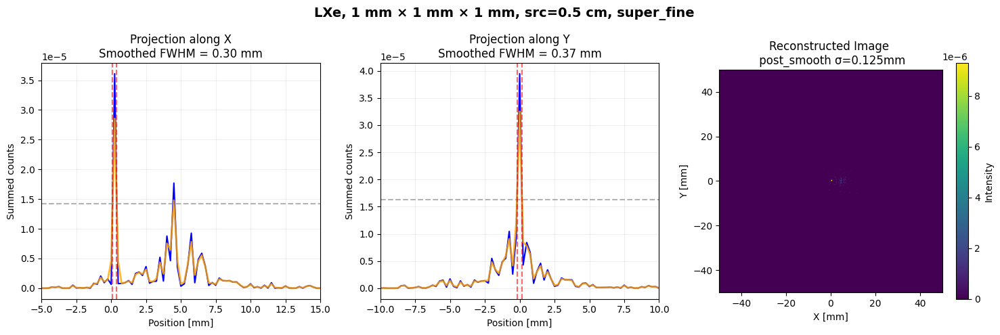

[Direct] FWHM_x = 1.25 mm
[Direct] FWHM_y = 1.91 mm


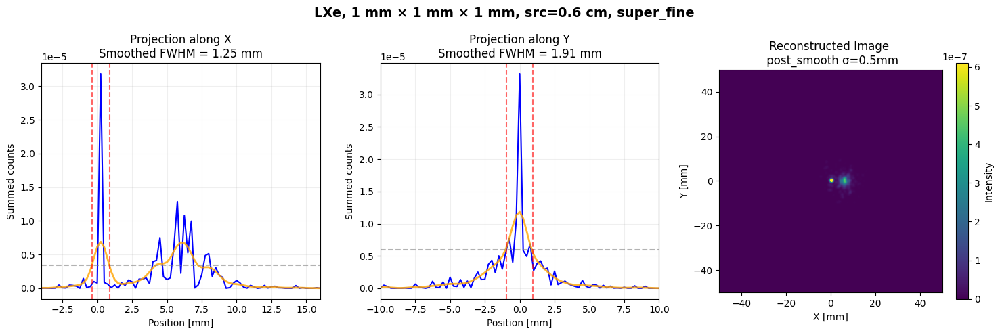

[Direct] FWHM_x = 3.52 mm
[Direct] FWHM_y = 2.11 mm


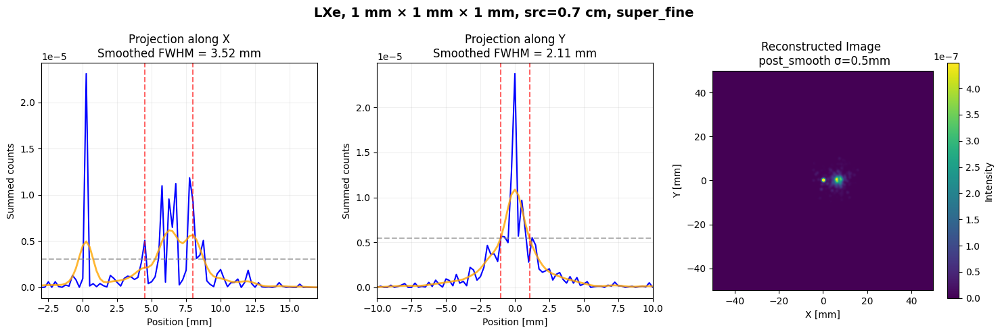

[Direct] FWHM_x = 2.31 mm
[Direct] FWHM_y = 2.48 mm


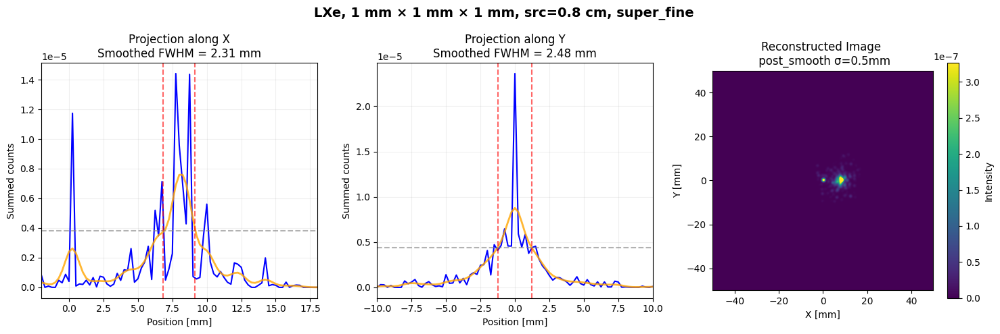

[Direct] FWHM_x = 3.08 mm
[Direct] FWHM_y = 1.96 mm


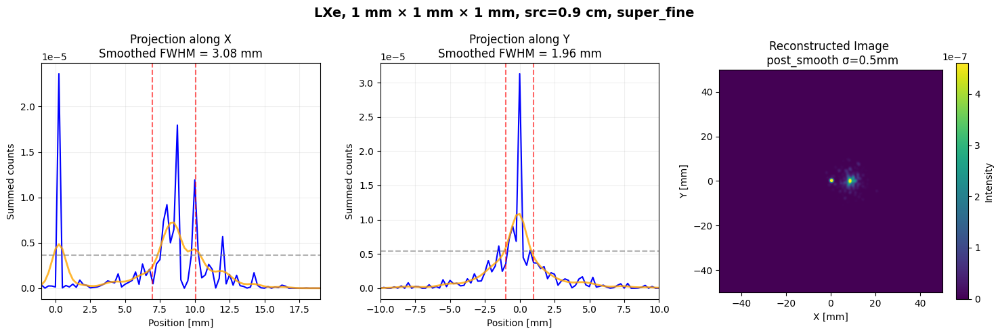

[Direct] FWHM_x = 2.85 mm
[Direct] FWHM_y = 3.47 mm


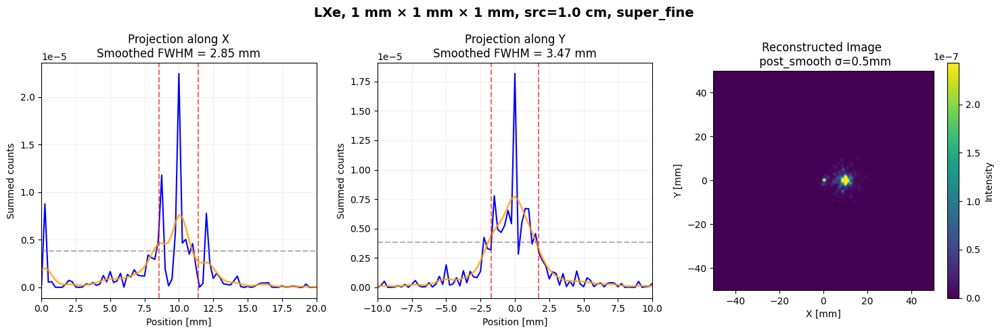

[Direct] FWHM_x = 3.05 mm
[Direct] FWHM_y = 3.34 mm


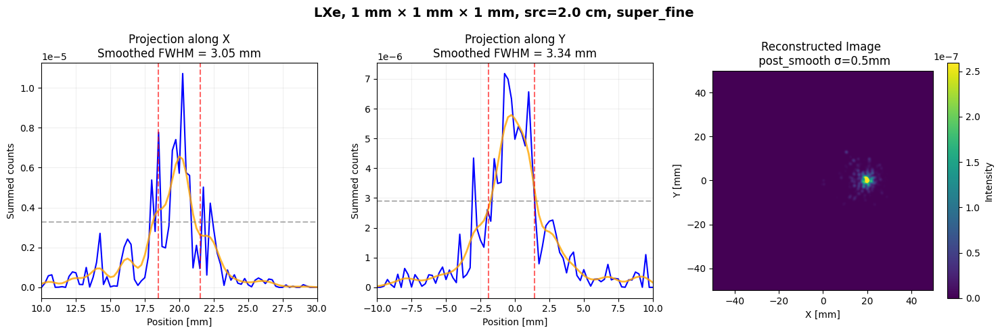

[Direct] FWHM_x = 3.27 mm
[Direct] FWHM_y = 3.65 mm


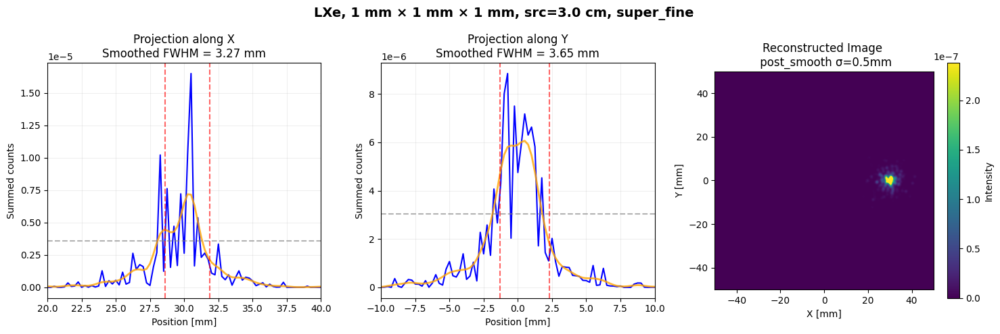

[Direct] FWHM_x = 3.18 mm
[Direct] FWHM_y = 3.31 mm


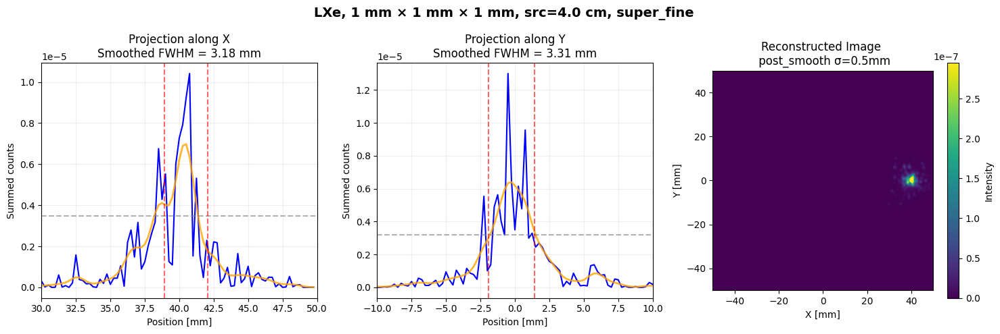

[Direct] FWHM_x = nan mm
[Direct] FWHM_y = 4.44 mm


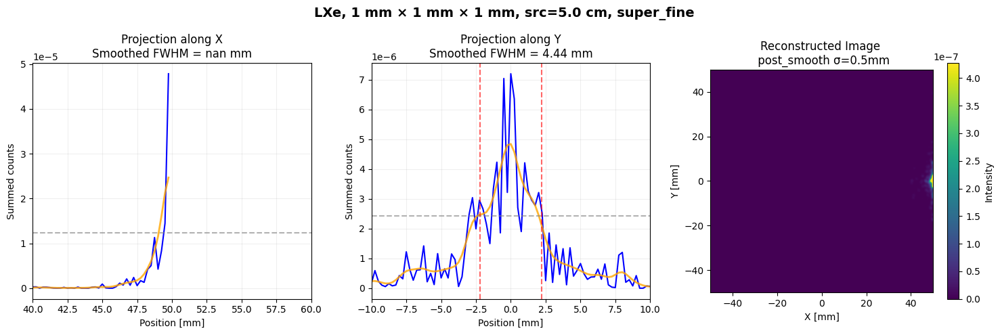

✅ All FWHM results computed and saved!


In [159]:

# ==============================================================
# Main Loop
# ==============================================================
for i_mat, material in enumerate(MATERIALS):
    for j_opt, crystal_option in enumerate(CRYSTAL_OPTIONS):
        for k_dist, source_dist in enumerate(SOURCE_DISTS):
            img = all_data[i_mat, j_opt, k_dist, 0, :, :]  # 2D image
            if np.isnan(img).all():
                print(f"[Skip] {material}, {crystal_option}, src={source_dist:.1f} cm (empty data)")
                continue
            if source_dist>0.5:
                smooth_sigma = 2.0
            else:
                smooth_sigma = SMOOTH_SIGMA_MAP[crystal_option]
            crystal_size_str = CRYSTAL_SIZE_MAP[crystal_option]

            # Smart vmax: half of the maximum non-NaN value
            smoothed_img = gaussian_filter(img, sigma=smooth_sigma)
            vmax = 0.5 * (np.nanmax(smoothed_img) + np.nanmean(smoothed_img))

            # Plot
            fig, axes = plt.subplots(1, 3, figsize=(15, 5))
            fwhm_x, fwhm_y = plot_1d_fwhm(img, axes=axes, smooth_sigma=smooth_sigma, shift_in_mm=source_dist * 10)
            plot_2d_image(img, fig=fig, ax=axes[2], vmax=vmax, smooth_sigma=smooth_sigma)

            # Title with crystal size and distance
            fig.suptitle(f"{material}, {crystal_size_str}, src={source_dist:.1f} cm, {crystal_option}",
                         fontsize=14, fontweight="bold", y=0.98)

            plt.tight_layout()
            #plt.savefig(f"fwhm_plot_{material}_{crystal_option}_src{source_dist:.1f}cm.png", dpi=150)
            #plt.close(fig)
            plt.show()

            # Save FWHM results
            fwhm_results[i_mat, j_opt, k_dist, 0] = fwhm_x
            fwhm_results[i_mat, j_opt, k_dist, 1] = fwhm_y

print("✅ All FWHM results computed and saved!")


In [ ]:
np.sum(~np.isnan(fwhm_results))

np.int64(174)

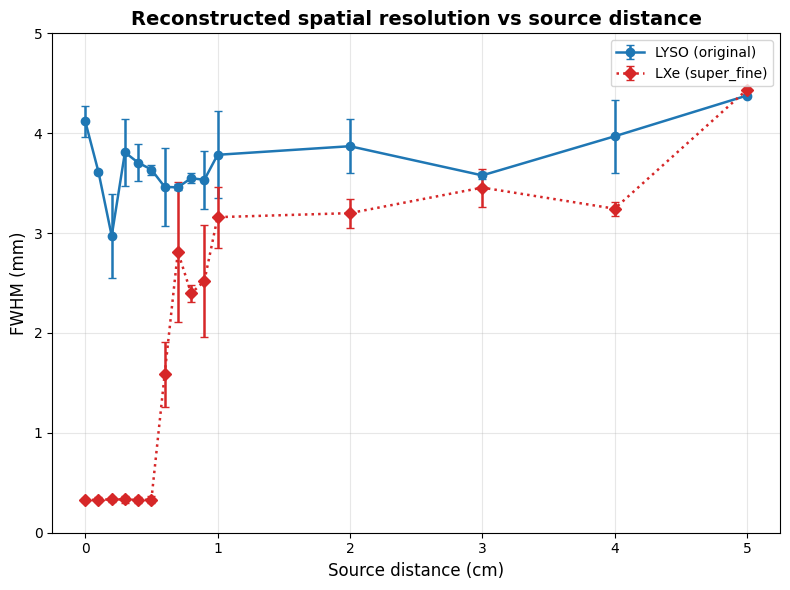

In [160]:
import numpy as np
import matplotlib.pyplot as plt

def plot_fwhm_vs_distance(fwhm_results, materials, crystal_options, source_dists,
                          combinations_to_plot):
    """
    combinations_to_plot: list of tuples like:
        [("LYSO", "original"), ("LXe", "fine"), ("LXe", "super_fine")]
    """

    # --------------------------------------------------------------
    # Style settings
    # --------------------------------------------------------------
    colors = {
        "LYSO": "tab:blue",
        "LXe": "tab:red",
    }
    styles = {
        "original": {"linestyle": "-",  "marker": "o"},
        "fine": {"linestyle": "--", "marker": "s"},
        "super_fine": {"linestyle": ":", "marker": "D"},
    }

    plt.figure(figsize=(8, 6))

    # --------------------------------------------------------------
    # Loop over requested combinations
    # --------------------------------------------------------------
    for material, option in combinations_to_plot:
        # Get indices
        i_mat = materials.index(material)
        j_opt = crystal_options.index(option)

        # Extract data
        fwhm_xy = fwhm_results[i_mat, j_opt, :, :]  # (13, 2)
        if np.isnan(fwhm_xy).all():
            print(f"[Skip] {material} {option}: all NaN")
            continue

        # Compute mean and error
        fwhm_mean = np.nanmean(fwhm_xy, axis=1)
        fwhm_err = np.abs(fwhm_xy[:, 0] - fwhm_xy[:, 1]) / 2.0

        # Plot
        plt.errorbar(
            source_dists,
            fwhm_mean,
            yerr=fwhm_err,
            color=colors.get(material, "black"),
            label=f"{material} ({option})",
            capsize=3,
            lw=1.8,
            **styles.get(option, {"linestyle": "-", "marker": "o"})
        )

    # --------------------------------------------------------------
    # Format
    # --------------------------------------------------------------
    plt.xlabel("Source distance (cm)", fontsize=12)
    plt.ylabel("FWHM (mm)", fontsize=12)
    plt.title("Reconstructed spatial resolution vs source distance",
              fontsize=14, fontweight="bold")
    plt.grid(True, alpha=0.3)
    plt.legend(fontsize=10)
    plt.tight_layout()
    plt.ylim(0,5)
    plt.show()


# ==============================================================
# Example usage
# ==============================================================
combinations_to_plot = [
    ("LYSO", "original"),
    #("LYSO", "super_fine"),
    #("LXe", "fine"),
    ("LXe", "super_fine"),
]

plot_fwhm_vs_distance(fwhm_results, MATERIALS, CRYSTAL_OPTIONS, SOURCE_DISTS,
                      combinations_to_plot)
